## Objective :- 
- To build a regression model using regularisation and predict the actual value of the prospective properties for decision related to investment.
- To find the variables that are significant in predicting the price of a house, and how well those variables describe the price of a house.
- To determine the optimal value of lambda for ridge and lasso regression.

### 1. Data Understanding and Exploration

In [1]:
# =============================================================================
# Import Libraries
# =============================================================================
import numpy as np                                                           # Importing Numpy 
import pandas as pd                                                          # Importing Pandas

from scipy import stats

pd.options.display.max_columns = 300    # set maximum column display
pd.options.display.max_rows = 1500    # set maximum row display

import matplotlib.pyplot as plt     # Importing Matplotlib pyplot
%matplotlib inline

import seaborn as sns               # Importing Seaborn

import datetime

# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

import os
print(os.listdir("D:\PG-IIIT_Banglore\ML-2\Advanced Linear Regression\My solution\RawfilesAndDataset"))

['data_description.txt', 'train.csv']


In [2]:
# =============================================================================
# Load the dataset
# =============================================================================
df_Housing = pd.read_csv('D:\\PG-IIIT_Banglore\\ML-2\\Advanced Linear Regression\\My solution\\RawfilesAndDataset\\train.csv')
print(df_Housing.shape)

(1460, 81)


In [3]:
df_Housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [4]:
df_Housing.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


# Feature Engineering

## Describe Data - Descriptive Statistics

Generate the descriptive statistics to get the basic quantitative information about the features of our data set.

In [5]:
#Review statistical parameter for each column
df_Housing.describe(percentiles=[0.25,0.50,0.75,0.99], include='all')

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
count,1460.000000,1460.000000,1460,1201.000000,1460.000000,1460,91,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460.000000,1460.000000,1460.000000,1460.000000,1460,1460,1460,1460,1452,1452.000000,1460,1460,1460,1423,1423,1422,1423,1460.000000,1422,1460.000000,1460.000000,1460.000000,1460,1460,1460,1459,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460,1460.000000,1460,1460.000000,770,1379,1379.000000,1379,1460.000000,1460.000000,1379,1379,1460,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,7,281,54,1460.000000,1460.000000,1460.000000,1460,1460,1460.000000
unique,NaN,NaN,5,NaN,NaN,2,2,4,4,2,5,3,25,9,8,5,8,NaN,NaN,NaN,NaN,6,8,15,16,4,NaN,4,5,6,4,4,4,6,NaN,6,NaN,NaN,NaN,6,5,2,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,NaN,7,NaN,5,6,NaN,3,NaN,NaN,5,5,3,NaN,NaN,NaN,NaN,NaN,NaN,3,4,4,NaN,NaN,NaN,9,6,NaN
top,NaN,NaN,RL,NaN,NaN,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,NaN,NaN,NaN,NaN,Gable,CompShg,VinylSd,VinylSd,None,NaN,TA,TA,PConc,TA,TA,No,Unf,NaN,Unf,NaN,NaN,NaN,GasA,Ex,Y,SBrkr,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,TA,NaN,Typ,NaN,Gd,Attchd,NaN,Unf,NaN,NaN,TA,TA,Y,NaN,NaN,NaN,NaN,NaN,NaN,Gd,MnPrv,Shed,NaN,NaN,NaN,WD,Normal,NaN
freq,NaN,NaN,1151,NaN,NaN,1454,50,925,1311,1459,1052,1382,225,1260,1445,1220,726,NaN,NaN,NaN,NaN,1141,1434,515,504,864,NaN,906,1282,647,649,1311,953,430,NaN,1256,NaN,NaN,NaN,1428,741,1365,1334,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,735,NaN,1360,NaN,380,870,NaN,605,NaN,NaN,1311,1326,1340,NaN,NaN,NaN,NaN,NaN,NaN,3,157,49,NaN,NaN,NaN,1267,1198,NaN
mean,730.500000,56.897260,NaN,70.049958,10516.828082,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.099315,5.575342,1971.267808,1984.865753,NaN,NaN,NaN,NaN,NaN,103.685262,NaN,NaN,NaN,NaN,NaN,NaN,NaN,443.639726,NaN,46.549315,567.240411,1057.429452,NaN,NaN,NaN,NaN,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,NaN,6.517808,NaN,0.613014,NaN,NaN,1978.506164,NaN,1.767123,472.980137,NaN,NaN,NaN,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,NaN,NaN,NaN,43.489041,6.321918,2007.815753,NaN,NaN,180921.195890
std,421.610009,42.300571,NaN,24.284752,9981.264932,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.382997,1.112799,30.202904,20.645407,NaN,NaN,NaN,NaN,NaN,181.066207,NaN,NaN,NaN,NaN,NaN,NaN,NaN,456.098091,NaN,161.319273,441.866955,438.705324,NaN,NaN,NaN,NaN,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,NaN,1.625393,NaN,0.644666,NaN,NaN,24.689725,NaN,0.747315,213.804841,NaN,NaN,NaN,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,NaN,NaN,NaN,496.123024,2.703626,1.328095,NaN,NaN,79442.502883
min,1.000000,20.000000,NaN,21.000000,1300.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,1.000000,1872.000000,1950.000000,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,2.000000,NaN,0.000000,NaN,NaN,1900.000000,NaN

In [6]:
# Dropping duplicate values in dataset, if exist
df_HousingNew = df_Housing.drop_duplicates()
print('Shape of the orginal df:', df_Housing.shape)
print('Shape after dropping duplicate values:', df_HousingNew.shape)

Shape of the orginal df: (1460, 81)
Shape after dropping duplicate values: (1460, 81)


There is no change in shape, which represents that there are no duplicate values in the dataset

In [7]:
#Checking the Null values , column-wise
df_missing = df_HousingNew.isnull().sum(axis=0).sort_values(ascending = False)
df_missing = df_missing[df_missing!=0]
df_missing

PoolQC          1453
MiscFeature     1406
Alley           1369
Fence           1179
FireplaceQu      690
LotFrontage      259
GarageYrBlt       81
GarageCond        81
GarageType        81
GarageFinish      81
GarageQual        81
BsmtFinType2      38
BsmtExposure      38
BsmtQual          37
BsmtCond          37
BsmtFinType1      37
MasVnrArea         8
MasVnrType         8
Electrical         1
dtype: int64

In [8]:
# Determine the percentage of Null values
df_missing_percent = round(100*(df_HousingNew.isnull().sum()/len(df_HousingNew.index)), 2).sort_values(ascending = False)
df_missing_percent = df_missing_percent[df_missing_percent!=0]
df_missing_percent

PoolQC          99.52
MiscFeature     96.30
Alley           93.77
Fence           80.75
FireplaceQu     47.26
LotFrontage     17.74
GarageYrBlt      5.55
GarageCond       5.55
GarageType       5.55
GarageFinish     5.55
GarageQual       5.55
BsmtFinType2     2.60
BsmtExposure     2.60
BsmtQual         2.53
BsmtCond         2.53
BsmtFinType1     2.53
MasVnrArea       0.55
MasVnrType       0.55
Electrical       0.07
dtype: float64

In [9]:
# The columns having missing values greater than 80%
df_missing_percent[df_missing_percent.values>80].index

Index(['PoolQC', 'MiscFeature', 'Alley', 'Fence'], dtype='object')

In [10]:
# Let's drop the columns have nan values greater than 80% 
print('Shape of the orginal df:', df_HousingNew.shape)
df_HousingNew = df_Housing.drop(df_missing_percent[df_missing_percent.values>=80].index, axis = 1)
print('Shape after dropping:', df_HousingNew.shape)

Shape of the orginal df: (1460, 81)
Shape after dropping: (1460, 77)


In [11]:
# Checking the datatype of the columns having missing values
df_HousingNew[df_missing_percent[df_missing_percent.values<80].index].dtypes

FireplaceQu      object
LotFrontage     float64
GarageYrBlt     float64
GarageCond       object
GarageType       object
GarageFinish     object
GarageQual       object
BsmtFinType2     object
BsmtExposure     object
BsmtQual         object
BsmtCond         object
BsmtFinType1     object
MasVnrArea      float64
MasVnrType       object
Electrical       object
dtype: object

In [12]:
# The numerical columns having missing values
df_missing_percent[df_missing_percent.values<80].index[df_HousingNew[df_missing_percent[df_missing_percent.values<80].index].dtypes.values != 'object']

Index(['LotFrontage', 'GarageYrBlt', 'MasVnrArea'], dtype='object')

In [13]:
# As no Garage is built as of now for null values, so let's put current year 
#as in future we'll consider the age and it will be coming zero
df_HousingNew['GarageYrBlt'].fillna(pd.datetime.now().year, inplace=True)

AttributeError: 'JointGrid' object has no attribute 'annotate'

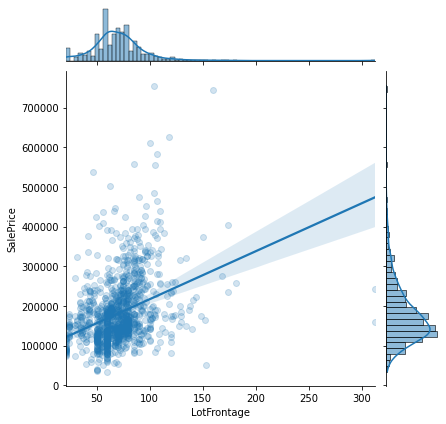

In [14]:
#Let's see how important the 'LotFrontage' column is
sns.jointplot(x='LotFrontage', 
              y='SalePrice', 
              data = df_HousingNew, 
              kind='reg', 
              scatter_kws={"alpha": 0.2}).annotate(stats.pearsonr)

In [15]:
# As per the data dictionary "LotFrontage" is Linear feet of street connected to property.  
# Since it is a numeric with a fair distribution, it can be imputed with similar 'Neighborhood' values
df_HousingNew['LotFrontage'] = df_HousingNew.groupby("Neighborhood")["LotFrontage"].transform(lambda x: x.fillna(x.median()))

AttributeError: 'JointGrid' object has no attribute 'annotate'

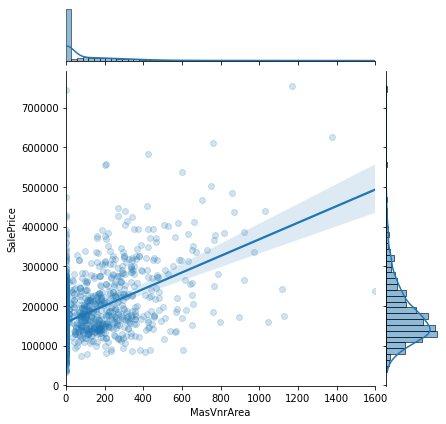

In [16]:
#Let's see how important the 'MasVnrArea' column is
sns.jointplot(x='MasVnrArea', 
              y='SalePrice', 
              data = df_HousingNew, 
              kind='reg', 
              scatter_kws={"alpha": 0.2}).annotate(stats.pearsonr)

In [17]:
#Looks like 'MasVnrArea' is an important column. Replace missing values of MasVnrArea with Median
df_HousingNew['MasVnrArea'].fillna(df_HousingNew['MasVnrArea'].median(), inplace=True)

In [18]:
# The caterical columns having missing values
df_missing_percent[df_missing_percent.values<80].index[df_HousingNew[df_missing_percent[df_missing_percent.values<80].index].dtypes.values == 'object']

Index(['FireplaceQu', 'GarageCond', 'GarageType', 'GarageFinish', 'GarageQual',
       'BsmtFinType2', 'BsmtExposure', 'BsmtQual', 'BsmtCond', 'BsmtFinType1',
       'MasVnrType', 'Electrical'],
      dtype='object')

In [19]:
# Check the unique values along with its count for caterical columns having missing values
for col in df_missing_percent[df_missing_percent.values<80].index[df_HousingNew[df_missing_percent[df_missing_percent.values<80].index].dtypes.values == 'object']:
    print("\n***** ",col, " *****" )
    print(df_HousingNew[col].value_counts())


*****  FireplaceQu  *****
Gd    380
TA    313
Fa     33
Ex     24
Po     20
Name: FireplaceQu, dtype: int64

*****  GarageCond  *****
TA    1326
Fa      35
Gd       9
Po       7
Ex       2
Name: GarageCond, dtype: int64

*****  GarageType  *****
Attchd     870
Detchd     387
BuiltIn     88
Basment     19
CarPort      9
2Types       6
Name: GarageType, dtype: int64

*****  GarageFinish  *****
Unf    605
RFn    422
Fin    352
Name: GarageFinish, dtype: int64

*****  GarageQual  *****
TA    1311
Fa      48
Gd      14
Ex       3
Po       3
Name: GarageQual, dtype: int64

*****  BsmtFinType2  *****
Unf    1256
Rec      54
LwQ      46
BLQ      33
ALQ      19
GLQ      14
Name: BsmtFinType2, dtype: int64

*****  BsmtExposure  *****
No    953
Av    221
Gd    134
Mn    114
Name: BsmtExposure, dtype: int64

*****  BsmtQual  *****
TA    649
Gd    618
Ex    121
Fa     35
Name: BsmtQual, dtype: int64

*****  BsmtCond  *****
TA    1311
Gd      65
Fa      45
Po       2
Name: BsmtCond, dtype: int64

*

In [20]:
for col in ['FireplaceQu', 'GarageCond', 'GarageType', 'GarageFinish', 'GarageQual',
       'BsmtExposure', 'BsmtFinType2', 'BsmtFinType1', 'BsmtCond', 'BsmtQual',
       'MasVnrType', 'Electrical']:
    if col in ['MasVnrType', 'Electrical']:
        # Impute with mode 
        df_HousingNew[col].fillna(df_HousingNew[col].mode()[0], inplace=True)
    else:
        # Impute with "NA"
        df_HousingNew[col].fillna('NA', inplace=True)

In [21]:
#Rechecking the Null values , column-wise
df_missing = df_HousingNew.isnull().sum(axis=0).sort_values(ascending = False)
df_missing = df_missing[df_missing!=0]
df_missing

Series([], dtype: int64)

All the missing value treatment done. There are no missing values in the dataset any longer.

In [22]:
df_HousingNew.shape

(1460, 77)

In [23]:
# Check for unique values in the dataset
df_HousingNew.nunique().sort_values(ascending = False)

Id               1460
LotArea          1073
GrLivArea         861
BsmtUnfSF         780
1stFlrSF          753
TotalBsmtSF       721
SalePrice         663
BsmtFinSF1        637
GarageArea        441
2ndFlrSF          417
MasVnrArea        327
WoodDeckSF        274
OpenPorchSF       202
BsmtFinSF2        144
EnclosedPorch     120
LotFrontage       115
YearBuilt         112
GarageYrBlt        98
ScreenPorch        76
YearRemodAdd       61
Neighborhood       25
LowQualFinSF       24
MiscVal            21
3SsnPorch          20
Exterior2nd        16
Exterior1st        15
MSSubClass         15
MoSold             12
TotRmsAbvGrd       12
OverallQual        10
OverallCond         9
Condition1          9
SaleType            9
RoofMatl            8
PoolArea            8
HouseStyle          8
Condition2          8
BedroomAbvGr        8
BsmtFinType2        7
GarageType          7
Functional          7
BsmtFinType1        7
GarageQual          6
FireplaceQu         6
SaleCondition       6
GarageCond

In [24]:
# Let's drop the "Id" column as it is just an identifoer of the records and it is not going to help in model building
df_HousingNew.drop('Id', axis = 1, inplace = True)
print(df_HousingNew.shape)

(1460, 76)


In [25]:
# Creating derived features
# Converting dates (YearBuilt, YearRemodAdd, GarageYrBlt, YrSold) to days 
# (Age_YearBuilt, Age_YearRemodAdd, Age_GarageYrBlt, Age_YrSold) from today
df_HousingNew['Age_YearBuilt'] = pd.datetime.now().year - df_HousingNew['YearBuilt']
df_HousingNew['Age_YearRemodAdd'] = pd.datetime.now().year - df_HousingNew['YearRemodAdd']
df_HousingNew['Age_GarageYrBlt'] = pd.datetime.now().year - df_HousingNew['GarageYrBlt']
df_HousingNew['Age_YrSold'] = pd.datetime.now().year - df_HousingNew['YrSold']

# Create a function to return 1 if there is any difference in "Age_YearBuilt" and "Age_YearRemodAdd" else 0 
# and the function will be used to create the derived feature "Remodel" 
def Diff_Age_Year(df_HousingNew):
    if (df_HousingNew['Age_YearRemodAdd'] - df_HousingNew['Age_YearBuilt']) != 0:
        val = 1
    else: 
        val = 0
    return val

# Create derived feature "Remodel" (Categorical variable to check whether remodelling done or not)
df_HousingNew['Remodel'] = df_HousingNew.apply(Diff_Age_Year, axis=1).astype('object')

In [26]:
# Let's drop the existing columns involved in creating derived features which are no longer required for building model
df_HousingNew.drop(['YearBuilt','YearRemodAdd', 'GarageYrBlt','YrSold'], axis = 1, inplace = True)
print(df_HousingNew.shape)

(1460, 77)


In [27]:
df_HousingNew.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SaleType,SaleCondition,SalePrice,Age_YearBuilt,Age_YearRemodAdd,Age_GarageYrBlt,Age_YrSold,Remodel
0,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NA,Attchd,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,WD,Normal,208500,19,19,19.0,14,0
1,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,WD,Normal,181500,46,46,46.0,15,0
2,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,WD,Normal,223500,21,20,21.0,14,1
3,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,WD,Abnorml,140000,107,52,24.0,16,1
4,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,WD,Normal,250000,22,22,22.0,14,0


In [28]:
df_HousingNew.dtypes

MSSubClass            int64
MSZoning             object
LotFrontage         float64
LotArea               int64
Street               object
LotShape             object
LandContour          object
Utilities            object
LotConfig            object
LandSlope            object
Neighborhood         object
Condition1           object
Condition2           object
BldgType             object
HouseStyle           object
OverallQual           int64
OverallCond           int64
RoofStyle            object
RoofMatl             object
Exterior1st          object
Exterior2nd          object
MasVnrType           object
MasVnrArea          float64
ExterQual            object
ExterCond            object
Foundation           object
BsmtQual             object
BsmtCond             object
BsmtExposure         object
BsmtFinType1         object
BsmtFinSF1            int64
BsmtFinType2         object
BsmtFinSF2            int64
BsmtUnfSF             int64
TotalBsmtSF           int64
Heating             

In [29]:
# Considering Categorical Variables
var_categorical = df_HousingNew.dtypes[df_HousingNew.dtypes == "object"]
var_categorical

MSZoning         object
Street           object
LotShape         object
LandContour      object
Utilities        object
LotConfig        object
LandSlope        object
Neighborhood     object
Condition1       object
Condition2       object
BldgType         object
HouseStyle       object
RoofStyle        object
RoofMatl         object
Exterior1st      object
Exterior2nd      object
MasVnrType       object
ExterQual        object
ExterCond        object
Foundation       object
BsmtQual         object
BsmtCond         object
BsmtExposure     object
BsmtFinType1     object
BsmtFinType2     object
Heating          object
HeatingQC        object
CentralAir       object
Electrical       object
KitchenQual      object
Functional       object
FireplaceQu      object
GarageType       object
GarageFinish     object
GarageQual       object
GarageCond       object
PavedDrive       object
SaleType         object
SaleCondition    object
Remodel          object
dtype: object

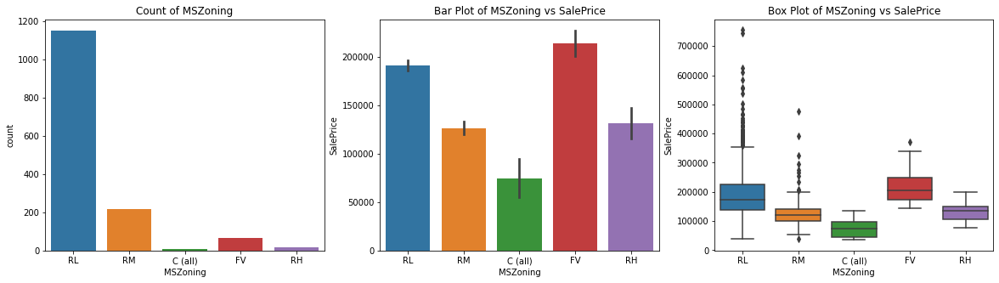

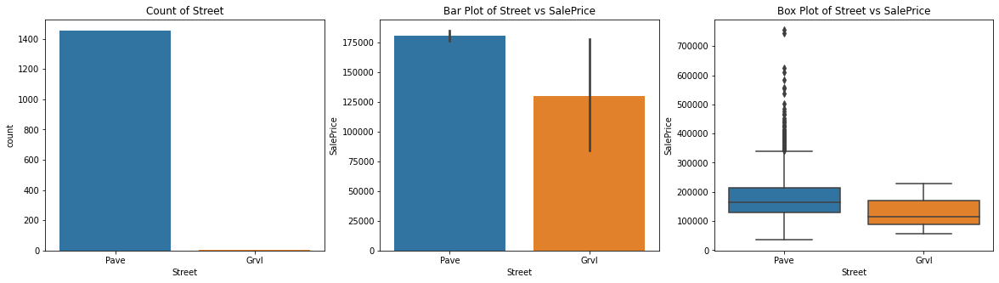

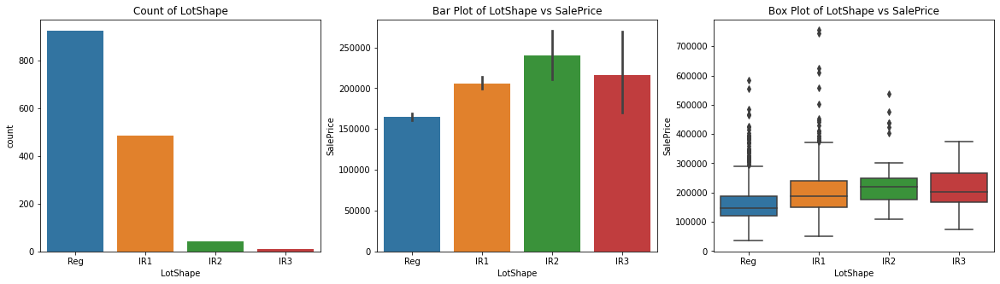

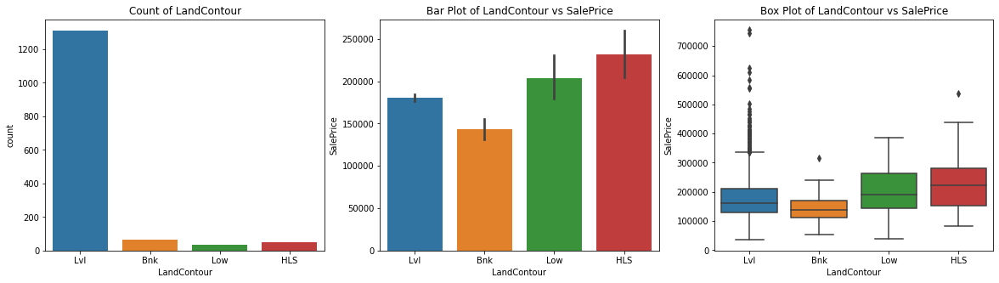

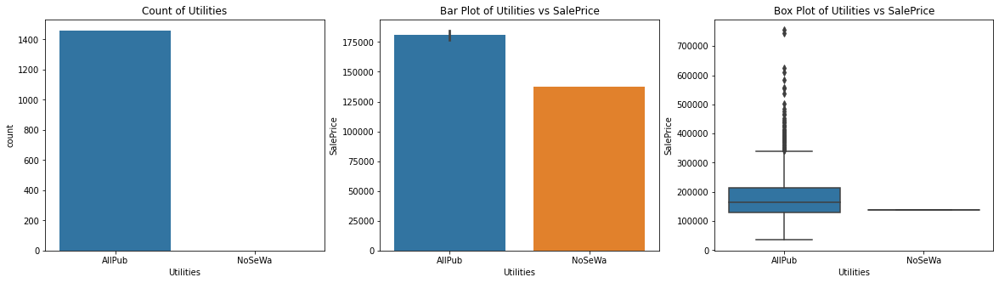

...

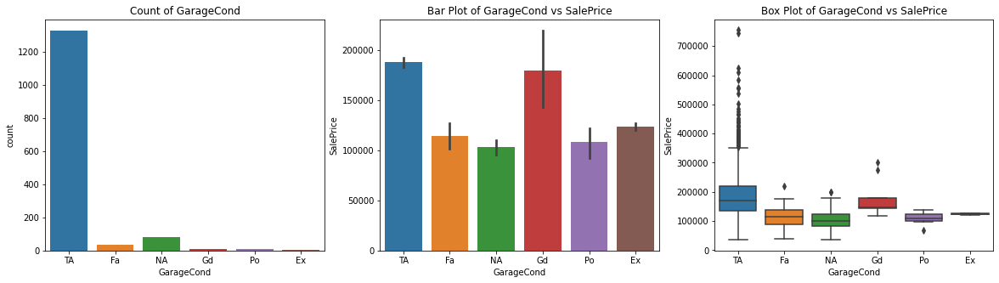

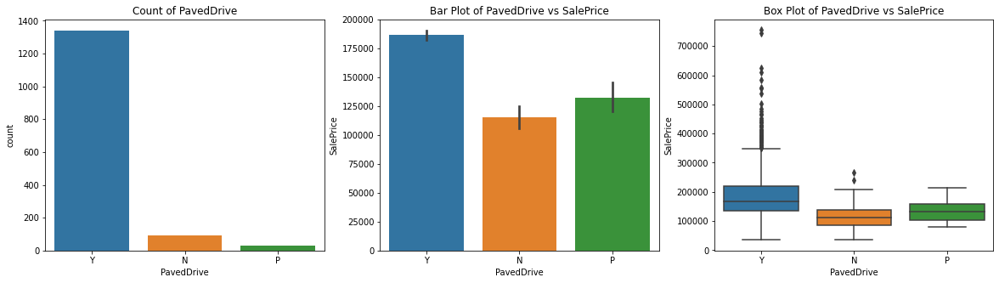

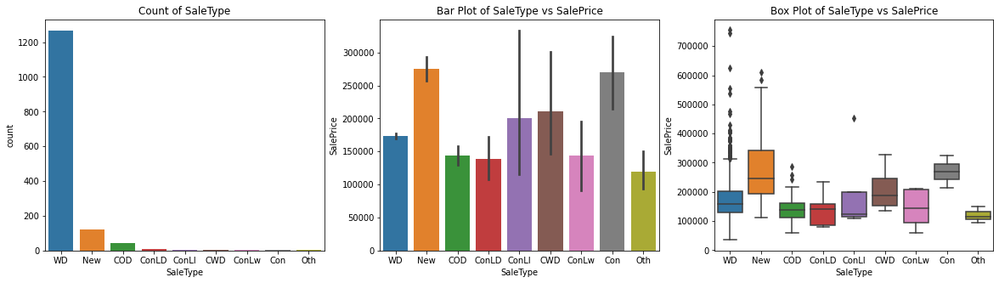

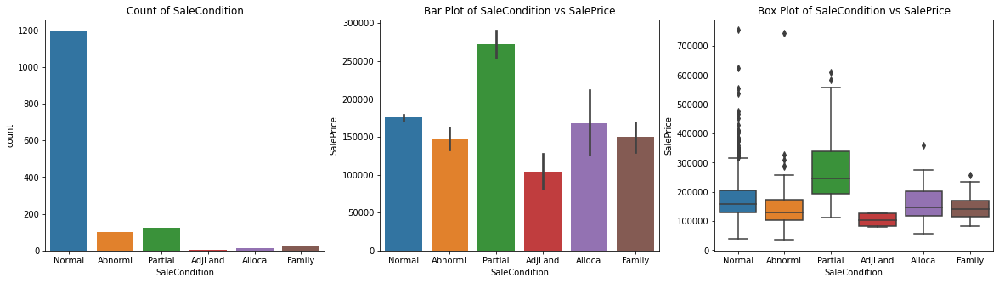

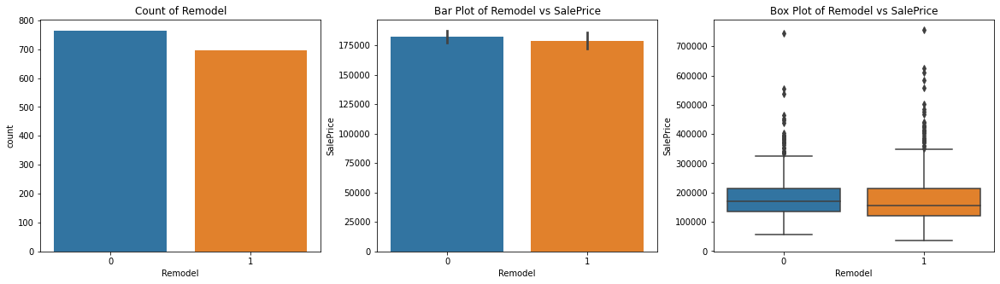

In [30]:
# visualization for categorical features
for i in var_categorical.index:
    plt.figure(figsize=(20,5))
    plt.subplot(131)
    sns.countplot(df_HousingNew[i])
    plt.title("Count of " + i)

    plt.subplot(132)
    sns.barplot(x = i, y = 'SalePrice', data = df_HousingNew)
    plt.title("Bar Plot of "+ i+  " vs SalePrice")

    plt.subplot(133)
    sns.boxplot(x = i, y = 'SalePrice', data = df_HousingNew)
    plt.title("Box Plot of "+ i+ " vs SalePrice")

In [31]:
# From the above analysis, it is clear that there are many categorical features which are highly skewed.
# Let's determine those categorical features which are highly skewed (Data lies atleast 80% in a label of a categorical feature)
cat_skew = []
for i in var_categorical.index:
    top_percent = (df_HousingNew[i].value_counts().sort_values(ascending = False)[0]/len(df_HousingNew[i]))*100
    if top_percent >= 80:
        cat_skew.append(i)
cat_skew        

['Street',
 'LandContour',
 'Utilities',
 'LandSlope',
 'Condition1',
 'Condition2',
 'BldgType',
 'RoofMatl',
 'ExterCond',
 'BsmtCond',
 'BsmtFinType2',
 'Heating',
 'CentralAir',
 'Electrical',
 'Functional',
 'GarageQual',
 'GarageCond',
 'PavedDrive',
 'SaleType',
 'SaleCondition']

In [32]:
# Dropping the categorical columns which are highly skewed
#df_HousingNew.drop(cat_skew, axis = 1, inplace = True)

# Dealing with highly skewed categorical columns
label_counts_new = []
for i in cat_skew:
    label_counts = df_HousingNew[i].value_counts()
    for j in list(label_counts.values):
        label_counts_new.append(j/label_counts.values.sum())
    dict_col = dict(zip(list(label_counts.index), label_counts_new))    
    df_HousingNew[i].replace(dict_col, inplace=True)   

In [33]:
df_HousingNew[cat_skew].head()

,Street,LandContour,Utilities,LandSlope,Condition1,Condition2,BldgType,RoofMatl,ExterCond,BsmtCond,BsmtFinType2,Heating,CentralAir,Electrical,Functional,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.995890
1,0.99589,0.99589,0.99589,0.99589,0.00411,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.995890
2,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.995890
3,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.00411,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.897945
4,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,0.995890


In [34]:
df_HousingNew[cat_skew].dtypes

Street           float64
LandContour      float64
Utilities        float64
LandSlope        float64
Condition1       float64
Condition2       float64
BldgType         float64
RoofMatl         float64
ExterCond        float64
BsmtCond         float64
BsmtFinType2     float64
Heating          float64
CentralAir       float64
Electrical       float64
Functional       float64
GarageQual       float64
GarageCond       float64
PavedDrive       float64
SaleType         float64
SaleCondition    float64
dtype: object

In [35]:
# Dealing with "MSZoning" 
label_counts = df_HousingNew.groupby("MSZoning")["SalePrice"].median()
dict_col = dict(zip(list(label_counts.index), list(label_counts.values)))    
df_HousingNew['MSZoning'].replace(dict_col, inplace=True)  

In [36]:
# Considering Numerical features
var_numeric = df_HousingNew.dtypes[df_HousingNew.dtypes != "object"]
var_numeric

MSSubClass            int64
MSZoning              int64
LotFrontage         float64
LotArea               int64
Street              float64
LandContour         float64
Utilities           float64
LandSlope           float64
Condition1          float64
Condition2          float64
BldgType            float64
OverallQual           int64
OverallCond           int64
RoofMatl            float64
MasVnrArea          float64
ExterCond           float64
BsmtCond            float64
BsmtFinSF1            int64
BsmtFinType2        float64
BsmtFinSF2            int64
BsmtUnfSF             int64
TotalBsmtSF           int64
Heating             float64
CentralAir          float64
Electrical          float64
1stFlrSF              int64
2ndFlrSF              int64
LowQualFinSF          int64
GrLivArea             int64
BsmtFullBath          int64
BsmtHalfBath          int64
FullBath              int64
HalfBath              int64
BedroomAbvGr          int64
KitchenAbvGr          int64
TotRmsAbvGrd        

In [37]:
# Correlation Matrix
df_HousingNew[var_numeric.index].corr()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LandContour,Utilities,LandSlope,Condition1,Condition2,BldgType,OverallQual,OverallCond,RoofMatl,MasVnrArea,ExterCond,BsmtCond,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Functional,Fireplaces,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SaleType,SaleCondition,SalePrice,Age_YearBuilt,Age_YearRemodAdd,Age_GarageYrBlt,Age_YrSold
MSSubClass,1.000000,-0.196443,-0.370367,-0.139781,-0.024969,0.005399,0.022844,0.019488,0.053222,0.001559,-0.829022,0.032628,-0.059316,0.021156,0.023573,0.042641,-0.007236,-0.069836,0.044251,-0.065649,-0.140759,-0.238518,-0.051175,-0.101774,0.049369,-0.251758,0.307886,0.046474,0.074853,0.003491,-0.002333,0.131608,0.177354,-0.023438,0.281721,0.040380,-0.006080,-0.045569,-0.040110,-0.098672,-0.100363,-0.081212,-0.067873,-0.012579,-0.006100,-0.012037,-0.043825,-0.026030,0.008283,-0.007683,-0.013585,0.022036,0.034239,-0.084284,-0.027850,-0.040581,-0.106784,0.021407
MSZoning,-0.196443,1.000000,0.259643,0.132654,0.098992,0.068820,-0.008991,0.030138,0.025311,0.111523,0.168975,0.277836,-0.139564,-0.039169,0.126144,0.102844,-0.039279,0.164015,-0.046061,0.034216,0.048060,0.231506,0.107951,0.264834,0.194745,0.231588,-0.002582,-0.109704,0.158080,0.117412,0.021802,0.269429,0.174955,0.098645,-0.116610,0.115012,0.065329,0.167717,0.255018,0.254383,0.168435,0.161188,0.284642,0.121870,0.097036,-0.227239,0.031373,0.022839,0.023590,0.000092,-0.009948,-0.121299,-0.112710,0.325250,-0.465892,-0.251051,-0.237572,-0.009368
LotFrontage,-0.370367,0.259643,1.000000,0.335957,-0.043353,-0.068290,-0.017279,-0.076623,-0.043742,-0.027759,0.436096,0.239546,-0.043595,-0.180416,0.195830,0.027691,0.016846,0.232576,-0.040068,0.052237,0.119174,0.381038,0.012165,0.077890,0.062619,0.434109,0.075686,0.031873,0.385190,0.107226,0.006620,0.186561,0.054190,0.245232,-0.005627,0.332619,0.012939,0.249295,0.281393,0.339085,0.098743,0.104333,0.092773,0.088736,0.141734,0.008057,0.064654,0.041063,0.174567,0.005332,0.007370,-0.110652,-0.101711,0.349876,-0.120999,-0.084550,-0.019996,-0.004756
LotArea,-0.139781,0.132654,0.335957,1.000000,-0.197131,-0.245838,-0.010123,-0.116945,-0.022909,-0.015095,0.174375,0.105806,-0.005636,-0.131477,0.103321,0.000894,0.002079,0.214103,-0.094862,0.111170,-0.002618,0.260833,-0.098847,0.049755,0.037677,0.299475,0.050986,0.004779,0.263116,0.158155,0.048046,0.126031,0.014259,0.119690,-0.017784,0.190015,-0.022309,0.271364,0.154871,0.180403,0.065591,0.075212,0.018602,0.171698,0.084774,-0.018340,0.020423,0.043160,0.077672,0.038068,0.001205,-0.012722,-0.014568,0.263843,-0.014228,-0.013788,0.051291,0.014261
Street,-0.024969,0.098992,-0.043353,-0.197131,1.000000,0.114069,-0.001682,0.146703,0.014942,-0.005939,0.012487,0.058823,0.042848,-0.007598,0.017108,0.013174,-0.018578,-0.015643,0.013499,-0.038487,0.035229,0.005068,-0.008706,0.069869,0.025162,0.005950,0.046983,0.007724,0.044121,-0.050524,0.015485,0.046471,0.027628,0.028865,0.013583,0.046828,-0.014843,-0.005348,-0.020025,-0.047794,0.024171,0.024929,0.027522,-0.017990,-0.005664,0.023082,0.007473,-0.033160,0.004413,-0.022733,0.003690,0.012768,0.009412,0.041036,-0.021137,-0.065465,-0.010931,0.025043
LandContour,0.005399,0.068820,-0.068290,-0.245838,0.114069,1.000000,-0.007425,0.404863,0.030550,0.040630,-0.045624,0.089043,-0.030607,0.115228,0.066695,-0.000390,0.019754,-0.054905,-0.002412,-0.019964,0.066973,0.003033,-0.015653,0.105961,0.051714,-0.043652,-0.008409,-0.095599,-0.047946,-0.025175,0.018105,0.090045,0.027441,-0.009125,-0.041995,-0.018429,0.045212,-0.043695,0.068406,0.049159,0.067252,0.068575,0.127799,-0.017907,0.022525,-0.059063,-0.016529,-0.017816,-0.013579,0.018281,0.006722,-0.039573,-0.015668,0.046890,-0.177400,-0.113257,-0.088801,-0.017206
Utilities,0.022844,-0.008991,-0.01

(58.5, -0.5)

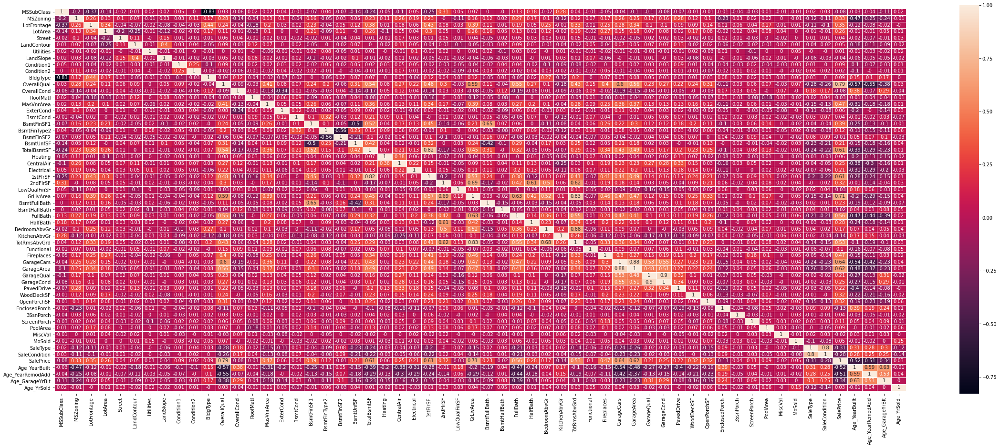

In [38]:
# Heatmap
plt.figure(figsize=(40, 15))
ax = sns.heatmap(round(df_HousingNew[var_numeric.index].corr(),2), annot = True,linewidth=0.5)
top, bottom = ax.get_ylim()
ax.set_ylim(top+0.5, bottom-0.5)

<Figure size 720x360 with 0 Axes>

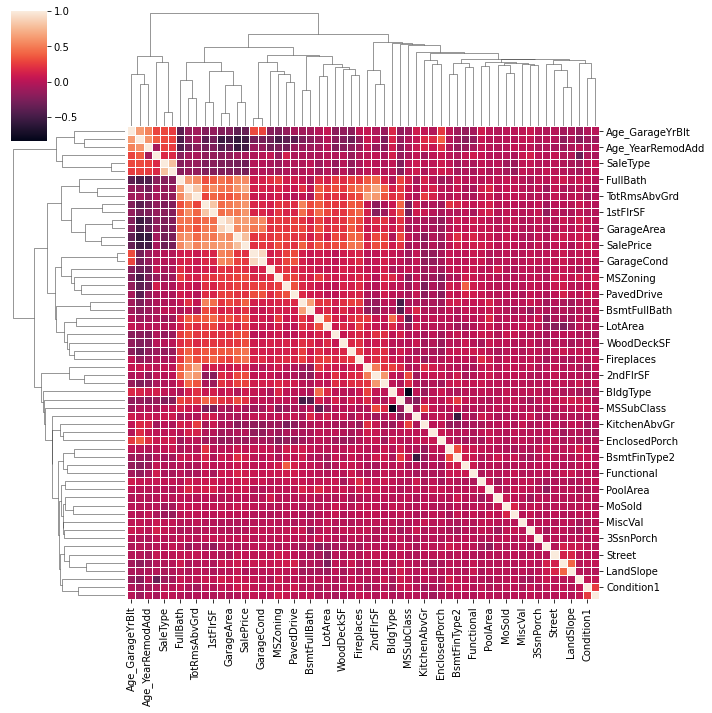

In [39]:
# Clustermap
plt.figure(figsize=(10,5))
sns.clustermap(df_HousingNew[var_numeric.index].corr(), linewidth=0.5)

In [40]:
sns.pairplot(df_HousingNew[var_numeric.index])

In [41]:
# As "SalePrice" is the target variable, therefore, we'll remove from the numeric feature variable list
var_numeric = var_numeric.drop('SalePrice', axis=0)
var_numeric

MSSubClass            int64
MSZoning              int64
LotFrontage         float64
LotArea               int64
Street              float64
LandContour         float64
Utilities           float64
LandSlope           float64
Condition1          float64
Condition2          float64
BldgType            float64
OverallQual           int64
OverallCond           int64
RoofMatl            float64
MasVnrArea          float64
ExterCond           float64
BsmtCond            float64
BsmtFinSF1            int64
BsmtFinType2        float64
BsmtFinSF2            int64
BsmtUnfSF             int64
TotalBsmtSF           int64
Heating             float64
CentralAir          float64
Electrical          float64
1stFlrSF              int64
2ndFlrSF              int64
LowQualFinSF          int64
GrLivArea             int64
BsmtFullBath          int64
BsmtHalfBath          int64
FullBath              int64
HalfBath              int64
BedroomAbvGr          int64
KitchenAbvGr          int64
TotRmsAbvGrd        

<Figure size 2160x720 with 0 Axes>

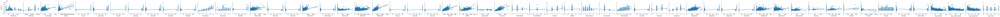

In [42]:
plt.figure(figsize=(30,10))
sns.pairplot(x_vars=var_numeric.index, y_vars = 'SalePrice', data = df_HousingNew, kind = 'reg')

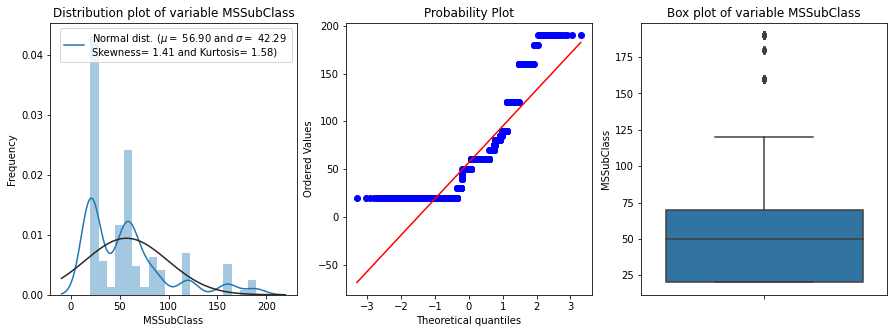

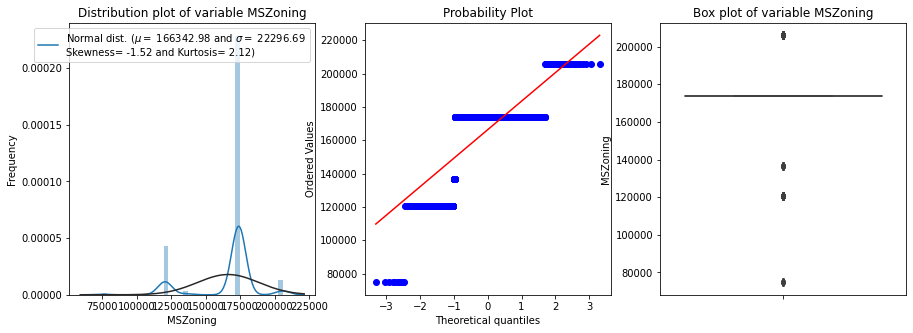

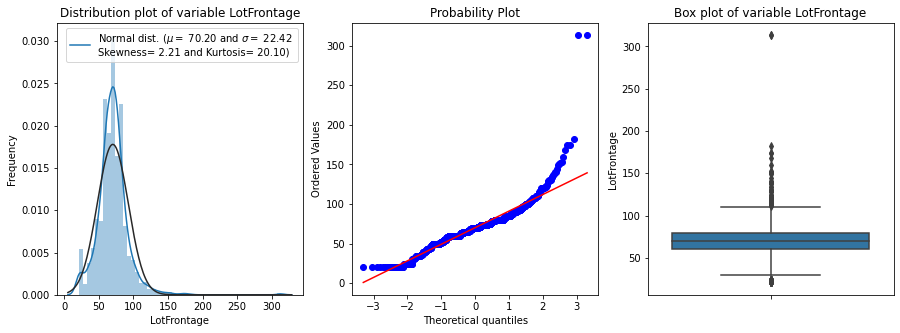

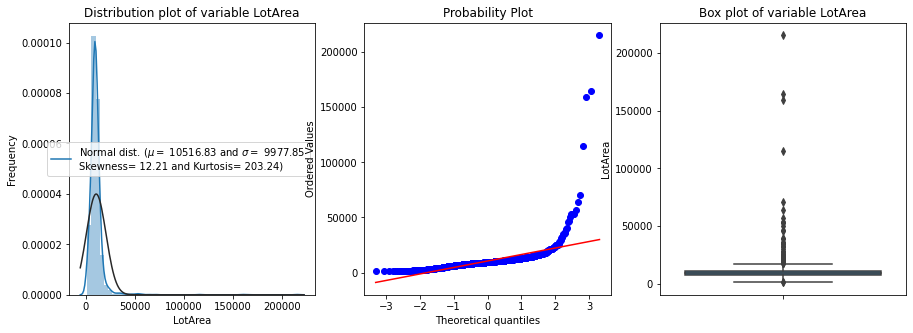

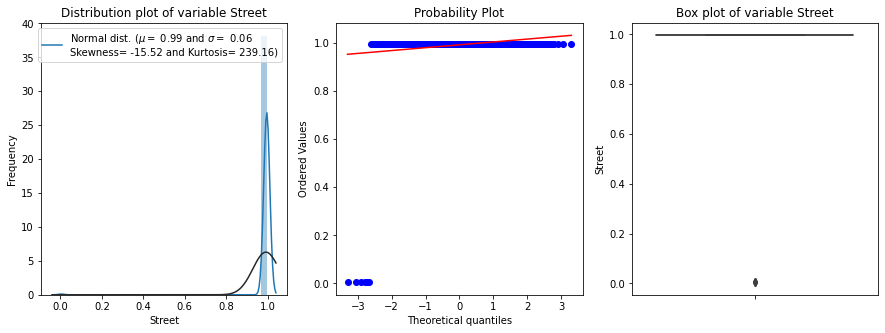

...

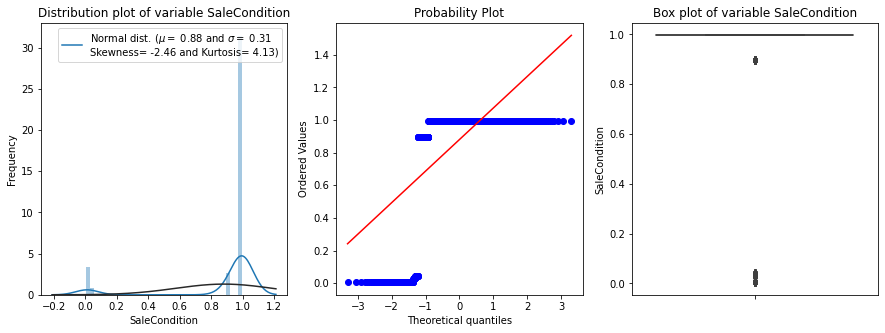

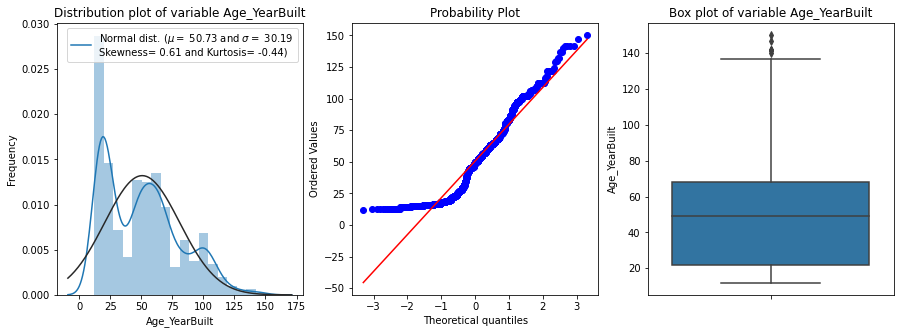

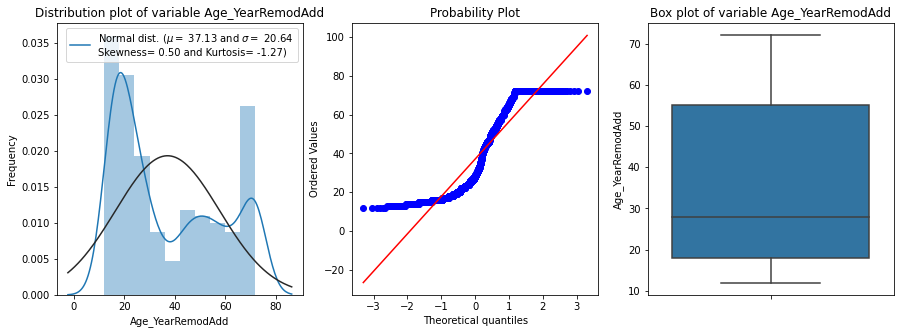

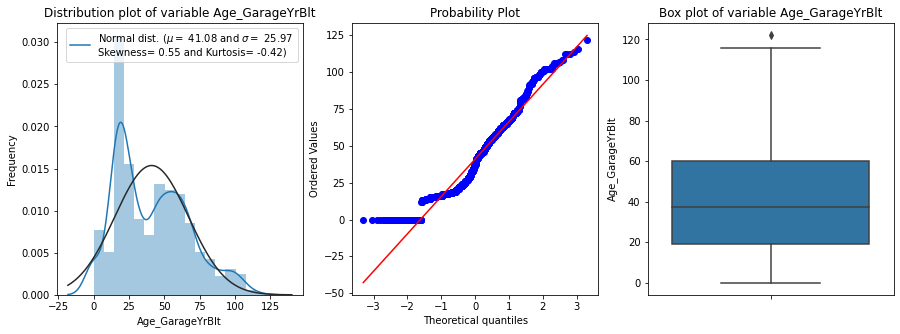

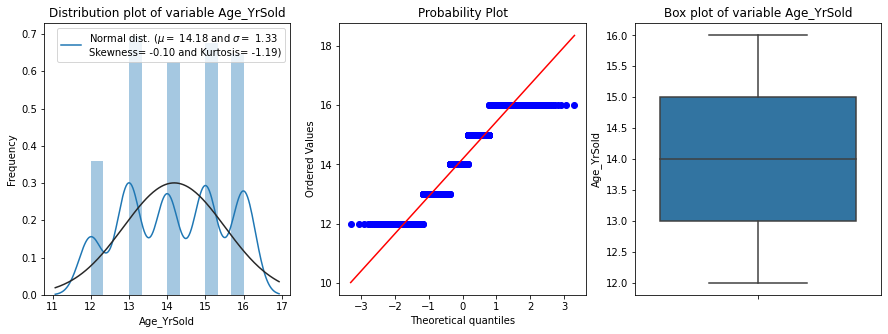

In [43]:
#Now plot the distribution of feature variables
from scipy.stats import norm
from scipy import stats

def transformation_plot(df,col_name):
    
    '''
    Create a function to plot the distribution plot and the QQ-plot
    '''
    #Check the new distribution 
    plt.figure(figsize=(15,5))
    plt.subplot(131)
    sns.distplot(df[col_name], fit=norm)

    # Get the fitted parameters used by the function
    (mu, sigma) = norm.fit(df[col_name])
    #skewness and kurtosis
    skew = df[col_name].skew()
    kurt = df[col_name].kurt()
    
    #print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

    plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} \nSkewness= {:.2f} and Kurtosis= {:.2f})'.format(mu, sigma, skew, kurt)],
                loc='best')
    plt.ylabel('Frequency')
    plt.title('Distribution plot of variable ' + col_name)

    #Get also the QQ-plot
    plt.subplot(132)
    res = stats.probplot(df[col_name], plot=plt)
    
    # Get the Box Plot
    plt.subplot(133)
    sns.boxplot(y = df[col_name])
    plt.title("Box plot of variable " + col_name)


# Checking for Distribution Plot, QQ-Plot and Box-Plot for the features
for i in var_numeric.index:
    transformation_plot(df_HousingNew, i)

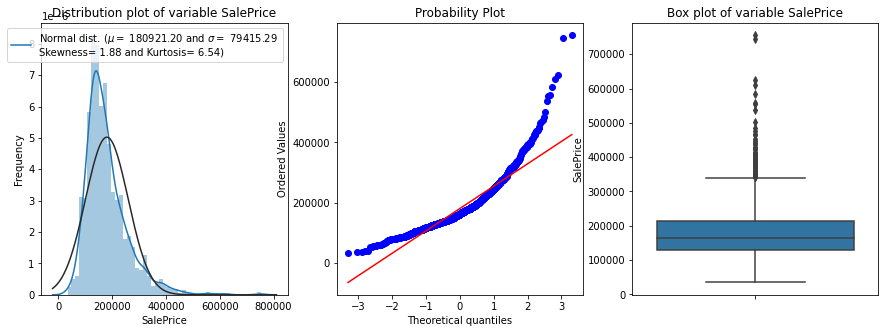

In [44]:
# Checking for Distribution Plot, QQ-Plot and Box Plot for the target variable "SalePrice"
transformation_plot(df_HousingNew, 'SalePrice')

The target variable is right skewed having skewness value of 1.88. Need to do transformation for the same.

In [45]:
#We use the numpy fuction log1p which  applies log(1+x) to all elements of the column "SalePrice"
df_HousingNew['SalePrice'] = np.log1p(df_HousingNew['SalePrice'])

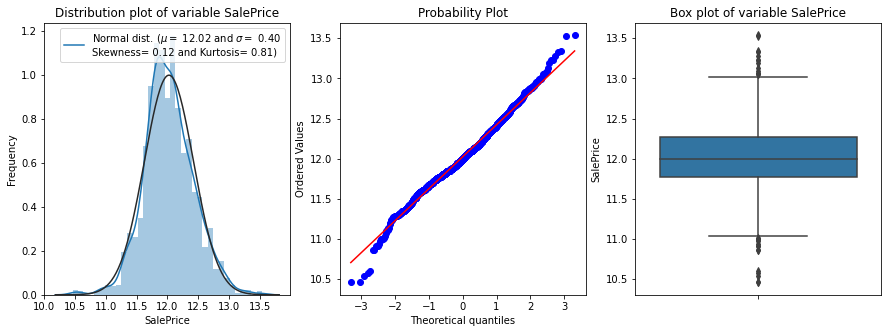

In [46]:
# Rechecking for Distribution Plot, QQ-Plot and Box Plot for the target variable "SalePrice"
transformation_plot(df_HousingNew, 'SalePrice')

Now the target variable "SalePrice" is no longer skewed and the QQ-Plot is also linear.

# Creating Dummy variables and Binary encoding for Categorical variables

In [47]:
# Considering Categorical Variables
var_categorical = df_HousingNew.dtypes[df_HousingNew.dtypes == "object"]
var_categorical

LotShape        object
LotConfig       object
Neighborhood    object
HouseStyle      object
RoofStyle       object
Exterior1st     object
Exterior2nd     object
MasVnrType      object
ExterQual       object
Foundation      object
BsmtQual        object
BsmtExposure    object
BsmtFinType1    object
HeatingQC       object
KitchenQual     object
FireplaceQu     object
GarageType      object
GarageFinish    object
Remodel         object
dtype: object

In [48]:
df_HousingNew[var_categorical.index].head()

,LotShape,LotConfig,Neighborhood,HouseStyle,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,HeatingQC,KitchenQual,FireplaceQu,GarageType,GarageFinish,Remodel
0,Reg,Inside,CollgCr,2Story,Gable,VinylSd,VinylSd,BrkFace,Gd,PConc,Gd,No,GLQ,Ex,Gd,NA,Attchd,RFn,0
1,Reg,FR2,Veenker,1Story,Gable,MetalSd,MetalSd,None,TA,CBlock,Gd,Gd,ALQ,Ex,TA,TA,Attchd,RFn,0
2,IR1,Inside,CollgCr,2Story,Gable,VinylSd,VinylSd,BrkFace,Gd,PConc,Gd,Mn,GLQ,Ex,Gd,TA,Attchd,RFn,1
3,IR1,Corner,Crawfor,2Story,Gable,Wd Sdng,Wd Shng,None,TA,BrkTil,TA,No,ALQ,Gd,Gd,Gd,Detchd,Unf,1
4,IR1,FR2,NoRidge,2Story,Gable,VinylSd,VinylSd,BrkFace,Gd,PConc,Gd,Av,GLQ,Ex,Gd,TA,Attchd,RFn,0


In [49]:
# categorical variables and their unique values
for i in var_categorical.index:
    print(i, "---> " ,df_HousingNew[i].unique())

LotShape --->  ['Reg' 'IR1' 'IR2' 'IR3']
LotConfig --->  ['Inside' 'FR2' 'Corner' 'CulDSac' 'FR3']
Neighborhood --->  ['CollgCr' 'Veenker' 'Crawfor' 'NoRidge' 'Mitchel' 'Somerst' 'NWAmes'
 'OldTown' 'BrkSide' 'Sawyer' 'NridgHt' 'NAmes' 'SawyerW' 'IDOTRR'
 'MeadowV' 'Edwards' 'Timber' 'Gilbert' 'StoneBr' 'ClearCr' 'NPkVill'
 'Blmngtn' 'BrDale' 'SWISU' 'Blueste']
HouseStyle --->  ['2Story' '1Story' '1.5Fin' '1.5Unf' 'SFoyer' 'SLvl' '2.5Unf' '2.5Fin']
RoofStyle --->  ['Gable' 'Hip' 'Gambrel' 'Mansard' 'Flat' 'Shed']
Exterior1st --->  ['VinylSd' 'MetalSd' 'Wd Sdng' 'HdBoard' 'BrkFace' 'WdShing' 'CemntBd'
 'Plywood' 'AsbShng' 'Stucco' 'BrkComm' 'AsphShn' 'Stone' 'ImStucc'
 'CBlock']
Exterior2nd --->  ['VinylSd' 'MetalSd' 'Wd Shng' 'HdBoard' 'Plywood' 'Wd Sdng' 'CmentBd'
 'BrkFace' 'Stucco' 'AsbShng' 'Brk Cmn' 'ImStucc' 'AsphShn' 'Stone'
 'Other' 'CBlock']
MasVnrType --->  ['BrkFace' 'None' 'Stone' 'BrkCmn']
ExterQual --->  ['Gd' 'TA' 'Ex' 'Fa']
Foundation --->  ['PConc' 'CBlock' 'BrkTil' 'W

In [50]:
# Convert categorical variables to binaries and numbers
cleanup_nums = {"ExterQual"    : {"Po"  : 0, "Fa"  : 0.25, "TA" : 0.5,  "Gd" : 0.75, "Ex": 1},
                "BsmtQual"     : {"NA"  : 0, "Po"  : 0.10, "Fa" : 0.25, "TA" : 0.50, "Gd": 0.75,  "Ex": 1},
                "BsmtExposure" : {"NA"  : 0, "No"  : 0.25, "Mn" : 0.50, "Av" : 0.75, "Gd": 1},
                "BsmtFinType1" : {"NA"  : 0, "Unf" : 0.20, "LwQ": 0.40, "Rec": 0.50, "BLQ": 0.60, "ALQ": 0.80, "GLQ": 1},
                "HeatingQC"    : {"Po"  : 0, "Fa"  : 0.25, "TA" : 0.5,  "Gd" : 0.75, "Ex": 1},
                "LotShape"     : {"Reg" : 0, "IR1" : 0.25, "IR2": 0.75, "IR3": 1},
                "KitchenQual"  : {"Po"  : 0, "Fa"  : 0.25, "TA" : 0.50, "Gd" : 0.75, "Ex": 1},
                "FireplaceQu"  : {"NA"  : 0, "Po"  : 0.10, "Fa" : 0.25, "TA" : 0.50, "Gd": 0.75,  "Ex": 1},
                "GarageFinish" : {"NA"  : 0, "Unf" : 0.25, "RFn": 0.75, "Fin": 1}}

df_HousingNew.replace(cleanup_nums, inplace=True)


# Convert categorical features into float datatype
features_float = ['ExterQual','BsmtQual','BsmtExposure','BsmtFinType1',
                  'HeatingQC','LotShape','KitchenQual','FireplaceQu','GarageFinish']

df_HousingNew[features_float] = df_HousingNew[features_float].astype('float64')


# Convert categorical features into integer datatype
features_int = ['Remodel']
df_HousingNew[features_int] = df_HousingNew[features_int].astype('int64')

df_HousingNew.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SaleType,SaleCondition,SalePrice,Age_YearBuilt,Age_YearRemodAdd,Age_GarageYrBlt,Age_YrSold,Remodel
0,60,174000,65.0,8450,0.99589,0.00,0.99589,0.99589,Inside,0.99589,CollgCr,0.99589,0.99589,0.99589,2Story,7,5,Gable,0.99589,VinylSd,VinylSd,BrkFace,196.0,0.75,0.99589,PConc,0.75,0.99589,0.25,1.0,706,0.99589,0,150,856,0.99589,1.00,0.99589,0.99589,856,854,0,1710,1,0,2,1,3,1,0.75,8,0.99589,0,0.00,Attchd,0.75,2,548,0.99589,0.99589,0.99589,0,61,0,0,0,0,0,2,0.99589,0.995890,12.247699,19,19,19.0,14,0
1,20,174000,80.0,9600,0.99589,0.00,0.99589,0.99589,FR2,0.99589,Veenker,0.00411,0.99589,0.99589,1Story,6,8,Gable,0.99589,MetalSd,MetalSd,None,0.0,0.50,0.99589,CBlock,0.75,0.99589,1.00,0.8,978,0.99589,0,284,1262,0.99589,1.00,0.99589,0.99589,1262,0,0,1262,0,1,2,0,3,1,0.50,6,0.99589,1,0.50,Attchd,0.75,2,460,0.99589,0.99589,0.99589,298,0,0,0,0,0,0,5,0.99589,0.995890,12.109016,46,46,46.0,15,0
2,60,174000,68.0,11250,0.99589,0.25,0.99589,0.99589,Inside,0.99589,CollgCr,0.99589,0.99589,0.99589,2Story,7,5,Gable,0.99589,VinylSd,VinylSd,BrkFace,162.0,0.75,0.99589,PConc,0.75,0.99589,0.50,1.0,486,0.99589,0,434,920,0.99589,1.00,0.99589,0.99589,920,866,0,1786,1,0,2,1,3,1,0.75,6,0.99589,1,0.50,Attchd,0.75,2,608,0.99589,0.99589,0.99589,0,42,0,0,0,0,0,9,0.99589,0.995890,12.317171,21,20,21.0,14,1
3,70,174000,60.0,9550,0.99589,0.25,0.99589,0.99589,Corner,0.99589,Crawfor,0.99589,0.99589,0.99589,2Story,7,5,Gable,0.99589,Wd Sdng,Wd Shng,None,0.0,0.50,0.99589,BrkTil,0.50,0.00411,0.25,0.8,216,0.99589,0,540,756,0.99589,0.75,0.99589,0.99589,961,756,0,1717,1,0,1,0,3,1,0.75,7,0.99589,1,0.75,Detchd,0.25,3,642,0.99589,0.99589,0.99589,0,35,272,0,0,0,0,2,0.99589,0.897945,11.849405,107,52,24.0,16,1
4,60,174000,84.0,14260,0.99589,0.25,0.99589,0.99589,FR2,0.99589,NoRidge,0.99589,0.99589,0.99589,2Story,8,5,Gable,0.99589,VinylSd,VinylSd,BrkFace,350.0,0.75,0.99589,PConc,0.75,0.99589,0.75,1.0,655,0.99589,0,490,1145,0.99589,1.00,0.99589,0.99589,1145,1053,0,2198,1,0,2,1,4,1,0.75,9,0.99589,1,0.50,Attchd,0.75,3,836,0.99589,0.99589,0.99589,192,84,0,0,0,0,0,12,0.99589,0.995890,12.429220,22,22,22.0,14,0


In [51]:
# Considering Categorical Variables
var_categorical = df_HousingNew.dtypes[df_HousingNew.dtypes == "object"]
var_categorical

LotConfig       object
Neighborhood    object
HouseStyle      object
RoofStyle       object
Exterior1st     object
Exterior2nd     object
MasVnrType      object
Foundation      object
GarageType      object
dtype: object

In [52]:
# categorical variables and their unique values
for i in var_categorical.index:
    print(i, "---> " ,df_HousingNew[i].unique())

LotConfig --->  ['Inside' 'FR2' 'Corner' 'CulDSac' 'FR3']
Neighborhood --->  ['CollgCr' 'Veenker' 'Crawfor' 'NoRidge' 'Mitchel' 'Somerst' 'NWAmes'
 'OldTown' 'BrkSide' 'Sawyer' 'NridgHt' 'NAmes' 'SawyerW' 'IDOTRR'
 'MeadowV' 'Edwards' 'Timber' 'Gilbert' 'StoneBr' 'ClearCr' 'NPkVill'
 'Blmngtn' 'BrDale' 'SWISU' 'Blueste']
HouseStyle --->  ['2Story' '1Story' '1.5Fin' '1.5Unf' 'SFoyer' 'SLvl' '2.5Unf' '2.5Fin']
RoofStyle --->  ['Gable' 'Hip' 'Gambrel' 'Mansard' 'Flat' 'Shed']
Exterior1st --->  ['VinylSd' 'MetalSd' 'Wd Sdng' 'HdBoard' 'BrkFace' 'WdShing' 'CemntBd'
 'Plywood' 'AsbShng' 'Stucco' 'BrkComm' 'AsphShn' 'Stone' 'ImStucc'
 'CBlock']
Exterior2nd --->  ['VinylSd' 'MetalSd' 'Wd Shng' 'HdBoard' 'Plywood' 'Wd Sdng' 'CmentBd'
 'BrkFace' 'Stucco' 'AsbShng' 'Brk Cmn' 'ImStucc' 'AsphShn' 'Stone'
 'Other' 'CBlock']
MasVnrType --->  ['BrkFace' 'None' 'Stone' 'BrkCmn']
Foundation --->  ['PConc' 'CBlock' 'BrkTil' 'Wood' 'Slab' 'Stone']
GarageType --->  ['Attchd' 'Detchd' 'BuiltIn' 'CarPort' 'N

In [53]:
# Create Dummy variables for categorical variables: 
for col_name in var_categorical.index:
    # Let's drop the first column from dummy df using 'drop_first = True' otherwise it will get multicollinear
    status = pd.get_dummies(df_HousingNew[col_name], drop_first = True)
    # Adding prefix to dummy column names so as to identify it later
    status = status.add_prefix(f'{col_name}_')
    print("\n=================== Creating Dummy variable for ", col_name, " =================== ")
    print(status.head())
    # Add the results to the original housing dataframe
    df_HousingNew = pd.concat([df_HousingNew, status], axis = 1)
    # Drop original categorical column as we have created the dummies for it
    df_HousingNew.drop(col_name, axis = 1, inplace = True)

df_HousingNew.head()


=================== Creating Dummy variable for  LotConfig  =================== 
   LotConfig_CulDSac  LotConfig_FR2  LotConfig_FR3  LotConfig_Inside
0                  0              0              0                 1
1                  0              1              0                 0
2                  0              0              0                 1
3                  0              0              0                 0
4                  0              1              0                 0

=================== Creating Dummy variable for  Neighborhood  =================== 
   Neighborhood_Blueste  Neighborhood_BrDale  Neighborhood_BrkSide  \
0                     0                    0                     0   
1                     0                    0                     0   
2                     0                    0                     0   
3                     0                    0                     0   
4                     0                    0                     0   

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LandSlope,Condition1,Condition2,BldgType,OverallQual,OverallCond,RoofMatl,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SaleType,SaleCondition,SalePrice,Age_YearBuilt,Age_YearRemodAdd,Age_GarageYrBlt,Age_YrSold,Remodel,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA
0,60,174000,65.0,8450,0.99589,0.00,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,7,5,0.99589,196.0,0.75,0.99589,0.75,0.99589,0.25,1.0,706,0.99589,0,150,856,0.99589,1.00,0.99589,0.99589,856,854,0,1710,1,0,2,1,3,1,0.75,8,0.99589,0,0.00,0.75,2,548,0.99589,0.99589,0.99589,0,61,0,0,0,0,0,2,0.99589,0.995890,12.247699,19,19,19.0,14,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0
1,20,174000,80.0,9600,0.99589,0.00,0.99589,0.99589,0.99589,0.00411,0.99589,0.99589,6,8,0.99589,0.0,0.50,0.99589,0.75,0.99589,1.00,0.8,978,0.99589,0,284,1262,0.99589,1.00,0.99589,0.99589,1262,0,0,1262,0,1,2,0,3,1,0.50,6,0.99589,1,0.50,0.75,2,460,0.99589,0.99589,0.99589,298,0,0,0,0,0,0,5,0.99589,0.995890,12.109016,46,46,46.0,15,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0
2,60,174000,68.0,11250,0.99589,0.25,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,7,5,0.99589,162.0,0.75,0.99589,0.75,0.99589,0.50,1.0,486,0.99589,0,434,920,0.99589,1.00,0.99589,0.99589,920,866,0,1786,1,0,2,1,3,1,0.75,6,0.99589,1,0.50,0.75,2,608,0.99589,0.99589,0.99589,0,42,0,0,0,0,0,9,0.99589,0.995890,12.317171,21,20,21.0,14,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0
3,70,174000,60.0,9550,0.99589,0.25,0.99589,0.99589,0.99589,0.99589,0.99589,0.99589,7,5,0.99589,0.0,0.50,0.99589,0.50,0.00411,0.25,0.8,216,0.99589,0,540,756,0.99589,0.75,0.99589,0.99589,961

In [54]:
df_HousingNew.shape

(1460, 151)

In [55]:
df_HousingNew.dtypes

MSSubClass                int64
MSZoning                  int64
LotFrontage             float64
LotArea                   int64
Street                  float64
LotShape                float64
LandContour             float64
Utilities               float64
LandSlope               float64
Condition1              float64
Condition2              float64
BldgType                float64
OverallQual               int64
OverallCond               int64
RoofMatl                float64
MasVnrArea              float64
ExterQual               float64
ExterCond               float64
BsmtQual                float64
BsmtCond                float64
BsmtExposure            float64
BsmtFinType1            float64
BsmtFinSF1                int64
BsmtFinType2            float64
BsmtFinSF2                int64
BsmtUnfSF                 int64
TotalBsmtSF               int64
Heating                 float64
HeatingQC               float64
CentralAir              float64
Electrical              float64
1stFlrSF

Now all the columns are numerical and categorical variables are also converted to numerical values.

In [56]:
# Before creating the model, let's check if the features are highly correlated. 

def correlation_cols_threshold(dataset, threshold, target_column):
    '''
    Create a function to return the columns of the dataset 
    which are highly correlated greater than the "threshold" limit
    '''
    to_drop = []
    col_corr = set() # Set of all the names of deleted columns
    corr_matrix = dataset.corr().abs()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if (corr_matrix.iloc[i, j] >= threshold) and (corr_matrix.columns[j] not in col_corr):
                colname = corr_matrix.columns[i] # getting the name of column
                col_corr.add(colname)
    to_drop =  list(col_corr)
    if target_column in to_drop:
        to_drop.remove(target_column)        
    return to_drop

# Let's determine feature with correlation more than 0.7
cont_corr = correlation_cols_threshold(df_HousingNew, threshold=0.7, target_column = 'SalePrice')
cont_corr

['Exterior2nd_MetalSd',
 'Exterior2nd_Plywood',
 'MasVnrType_None',
 'SaleCondition',
 'Exterior2nd_HdBoard',
 'Exterior2nd_VinylSd',
 'GarageCond',
 '1stFlrSF',
 'GarageType_Detchd',
 'RoofStyle_Hip',
 'Exterior2nd_Stucco',
 'GarageType_NA',
 'FireplaceQu',
 'GarageArea',
 'BldgType',
 'ExterQual',
 'Exterior2nd_CBlock',
 'HouseStyle_2Story',
 'HouseStyle_1Story',
 'Exterior2nd_Wd Sdng',
 'TotRmsAbvGrd',
 'Foundation_PConc',
 'Exterior2nd_CmentBd']

In [57]:
# Dropping the feature with correlation more than 0.7
df_HousingNew.drop(cont_corr, axis = 1, inplace = True)

In [58]:
df_HousingNew.shape

(1460, 128)

# Train-Test Split and feature scaling

In [59]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively
df_train, df_test = train_test_split(df_HousingNew, train_size = 0.7, test_size = 0.3, random_state = 0)

In [60]:
#from sklearn.preprocessing import MinMaxScaler
#scaler = MinMaxScaler()

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

#var_list = list(df_train.select_dtypes(exclude=['uint8']).columns)

#for i in features_float:
#    var_list.remove(i)

#for i in features_int:
#    var_list.remove(i)

# Do not include target variable in scaling
var_list = list(df_train.columns)
var_list.remove('SalePrice')
   
df_train[var_list] = scaler.fit_transform(df_train[var_list])
df_test[var_list] = scaler.transform(df_test[var_list])

In [61]:
df_train.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LandSlope,Condition1,Condition2,OverallQual,OverallCond,RoofMatl,MasVnrArea,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,Functional,Fireplaces,GarageFinish,GarageCars,GarageQual,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SaleType,SalePrice,Age_YearBuilt,Age_YearRemodAdd,Age_GarageYrBlt,Age_YrSold,Remodel,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_ImStucc,Exterior2nd_Other,Exterior2nd_Stone,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_Stone,Foundation_CBlock,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort
64,0.080380,0.347365,0.001789,-0.115350,0.070152,-0.639142,0.284383,0.031311,0.231404,0.327925,0.071426,0.678888,-0.503535,0.129967,2.591760,0.348797,0.632756,0.288347,-0.586246,1.230487,0.689646,0.346238,-0.298666,-0.571846,0.004372,0.130705,0.913919,0.271306,0.284813,1.412514,-0.119182,0.989293,1.128213,-0.241048,0.783200,1.241457,0.133049,-0.203739,0.757466,0.24057,-0.964974,0.545848,0.321572,0.281051,0.280384,3.747620,-0.167785,-0.367671,-0.115866,-0.278512,-0.053633,-0.095215,-1.587142,0.333221,12.299112,-0.862911,-0.649432,-0.674115,-0.867672,1.032861,-0.265011,-0.176955,-0.031311,0.614709,-0.044302,-0.099454,-0.204540,-0.155152,2.953610,-0.188406,-0.273380,-0.238612,-0.155152,-0.109055,-0.191176,-0.416609,-0.083086,-0.229297,-0.170979,-0.229297,-0.277496,-0.133963,-0.252075,-0.214724,-0.240896,-0.126176,-0.17399,-0.076885,-0.109055,-0.070152,-0.088867,-0.144914,-0.201928,0.531661,-0.088867,-0.076885,-0.044302,-0.031311,-0.031311,-0.188406,-0.031311,-0.199286,-0.419842,-0.031311,-0.395329,-0.30328,-0.044302,-0.130124,1.346355,-0.411741,-0.144914,-0.031311,-0.062715,-0.133963,-0.088867,-0.031311,-0.062715,-0.170979,1.550269,-0.324004,-0.871978,-0.137703,-0.070152,-0.031311,0.822508,-0.113564,-0.260752,-0.070152
682,1.503517,0.347365,0.470093,-0.745900,0.070152,-0.639142,-0.110027,0.031311,0.231404,0.327925,0.071426,-0.057716,-0.503535,0.129967,-0.568778,0.348797,0.632756,0.288347,0.365355,1.230487,1.304024,0.346238,-0.298666,-0.641195,0.574808,0.130705,0.913919,0.271306,0.284813,-0.804188,-0.119182,-0.445858,1.128213,-0.241048,-1.063561,-0.767303,-1.113215,-0.203739,0.757466,0.24057,0.608890,-0.940314,0.321572,0.281051,0.280384,1.651997,-0.700165,-0.367671,-0.115866,-0.278512,-0.053633,-0.095215,1.734254,0.333221,12.061053,-0.829831,-0.600656,-0.597860,-0.121342,1.032861,-0.265011,-0.176955,-0.031311,0.614709,-0.044302,-0.099454,-0.204540,6.445283,-0.338569,-0.188406,-0.273380,-0.238612,-0.155152,-0.109055,-0.191176,-0.416609,-0.083086,-0.229297,-0.170979,-0.229297,-0.277496,-0.133963,-0.252075,-0.214

In [62]:
df_train.describe()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LandSlope,Condition1,Condition2,OverallQual,OverallCond,RoofMatl,MasVnrArea,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,Functional,Fireplaces,GarageFinish,GarageCars,GarageQual,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SaleType,SalePrice,Age_YearBuilt,Age_YearRemodAdd,Age_GarageYrBlt,Age_YrSold,Remodel,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_ImStucc,Exterior2nd_Other,Exterior2nd_Stone,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_Stone,Foundation_CBlock,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort
count,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1021.000000,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1021.000000,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1021.000000,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1021.000000,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03
mean,-5.132471e-17,4.662719e-16,-2.783713e-17,-6.524327e-17,1.497116e-15,-6.089372e-18,4.593126e-16,7.094988e-15,6.263354e-16,1.043892e-17,1.889445e-15,1.043892e-17,-9.395031e-17,6.680911e-16,1.043892e-17,2.131280e-16,2.853306e-16,5.132471e-16,-2.609731e-17,-2.914200e-16,-8.177157e-17,2.435749e-17,1.739821e-17,-6.437336e-17,-2.087785e-17,2.296563e-16,2.296563e-16,4.105977e

In [63]:
df_test.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LandSlope,Condition1,Condition2,OverallQual,OverallCond,RoofMatl,MasVnrArea,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,Functional,Fireplaces,GarageFinish,GarageCars,GarageQual,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SaleType,SalePrice,Age_YearBuilt,Age_YearRemodAdd,Age_GarageYrBlt,Age_YrSold,Remodel,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_ImStucc,Exterior2nd_Other,Exterior2nd_Stone,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_Stone,Foundation_CBlock,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort
529,-0.868379,0.347365,0.189110,2.148426,0.070152,0.801397,0.284383,0.031311,0.231404,0.327925,0.071426,-0.057716,-2.291741,0.129967,-0.568778,0.348797,-0.661921,0.288347,-0.586246,-0.276985,1.806697,0.346238,-0.298666,0.579353,2.388504,0.130705,-1.173579,0.271306,0.284813,-0.804188,-0.119182,1.918375,1.128213,-0.241048,2.629961,-0.767303,1.379313,4.318389,-0.750084,-4.23892,2.182754,0.545848,0.321572,0.281051,0.280384,-0.739663,-0.700165,2.744129,-0.115866,-0.278512,-0.053633,-0.095215,-1.218098,0.333221,12.209193,0.460258,0.472432,0.202810,0.624987,1.032861,3.773434,-0.176955,-0.031311,-1.626785,-0.044302,-0.099454,-0.204540,-0.155152,-0.338569,5.307676,-0.27338,-0.238612,-0.155152,-0.109055,-0.191176,-0.416609,-0.083086,-0.229297,-0.170979,-0.229297,-0.277496,-0.133963,-0.252075,-0.214724,-0.240896,-0.126176,-0.17399,-0.076885,-0.109055,-0.070152,-0.088867,-0.144914,-0.201928,-1.880898,-0.088867,-0.076885,-0.044302,-0.031311,-0.031311,-0.188406,-0.031311,-0.199286,-0.419842,-0.031311,-0.395329,-0.303280,-0.044302,-0.130124,-0.742746,2.428713,-0.144914,-0.031311,-0.062715,-0.133963,-0.088867,-0.031311,15.945219,-0.170979,-0.645049,-0.324004,-0.871978,-0.137703,-0.070152,-0.031311,0.822508,-0.113564,-0.260752,-0.070152
491,-0.156810,0.347365,0.423262,-0.104174,0.070152,-0.639142,0.284383,0.031311,0.231404,-0.018676,0.071426,-0.057716,1.284671,0.129967,-0.568778,0.348797,-0.661921,0.288347,-0.586246,0.024509,-0.092290,-3.064756,0.745989,-0.756777,-0.607507,0.130705,-1.173579,0.271306,-3.604511,0.602521,-0.119182,0.108501,1.128213,-0.241048,-1.063561,-0.767303,0.133049,-0.203739,-2.257634,0.24057,2.182754,-0.940314,-1.040772,0.281051,0.280384,-0.739663,-0.700165,0.130217,-0.115866,-0.278512,-0.053633,-0.095215,0.627122,0.333221,11.798112,0.989525,1.691849,1.499132,1.371316,1.032861,-0.265011,-0.176955,-0.031311,0.614709,-0.044302,-0.099454,-0.204540,-0.155152,-0.338569,-0.188406,-0.27338,-0.238612,-0.155152,-0.109055,-0.191176,2.400331,-0.083086,-0.229297,-0.170979,-0.229297,-0.277496,-0.133963,-0.252075,-0

In [64]:
df_test.describe()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LandSlope,Condition1,Condition2,OverallQual,OverallCond,RoofMatl,MasVnrArea,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,Functional,Fireplaces,GarageFinish,GarageCars,GarageQual,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SaleType,SalePrice,Age_YearBuilt,Age_YearRemodAdd,Age_GarageYrBlt,Age_YrSold,Remodel,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_ImStucc,Exterior2nd_Other,Exterior2nd_Stone,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_Stone,Foundation_CBlock,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort
count,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,4.380000e+02,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,4.380000e+02,438.000000,438.000000,4.380000e+02,438.000000,438.000000,4.380000e+02,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,4.380000e+02,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000
mean,0.022436,-0.003200,0.038408,-0.015976,0.037446,-0.010962,0.012495,3.131121e-02,0.069580,-0.069536,-0.158478,0.049915,0.037418,0.072180,0.000895,0.016721,0.012020,-0.007416,0.045982,0.007989,0.009974,0.019436,-0.012488,0.011042,0.017284,-0.035669,0.072724,0.045439,0.056154,-0.057838,0.010604,-0.042373,0.041652,0.010836,-0.068502,0.003180,-0.114497,0.023399,0.072529,0.063664,0.001622,-0.051331,0.013645,-0.033294,0.099109,-0.016505,-0.034926,-0.086117,0.009604,-0.034997,0.097132,-0.070335,0.026372,-0.047384,12.027983,-0.036988,-0.027808,-0.074700,0.057572,-0.045328,-0.025286,0.035944,0.187653,-0.035221,-0.04

In [65]:
# Dividing into X and Y sets for the model building
y_train = df_train.pop('SalePrice')
X_train = df_train

y_test = df_test.pop('SalePrice')
X_test = df_test

# Building Model : Considering all features

In [66]:
# Importing Libraries related to Model Building
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.metrics import mean_squared_error, r2_score

In [67]:
# Plot residuals
def residual_plot(y_trainset_value,y_testset_value,y_train_pred,y_test_pred,title):
    # Plot residuals
    plt.scatter(y_train_pred, (y_train_pred - y_trainset_value), 
                c = "blue", marker = "s", label = "Training data")
    plt.scatter(y_test_pred, (y_test_pred - y_testset_value), 
                c = "lightgreen", marker = "s", label = "Validation data")
    plt.title(title)
    plt.xlabel("Predicted values")
    plt.ylabel("Residuals")
    plt.legend(loc = "upper left")
    plt.hlines(y = 0, xmin = min(min(y_train_pred),min(y_test_pred)),
           xmax = max(max(y_train_pred),max(y_test_pred)), color = "red")
    #plt.show()

# Plot predictions 
def prediction_plot(y_trainset_value,y_testset_value,y_train_pred,y_test_pred,title):
    # Plot predictions
    plt.scatter(y_train_pred, y_trainset_value, c = "blue", marker = "s", label = "Training data")
    plt.scatter(y_test_pred, y_testset_value, c = "lightgreen", marker = "s", label = "Validation data")
    plt.title(title)
    plt.xlabel("Predicted values")
    plt.ylabel("Real values")
    plt.legend(loc = "upper left")
    plt.plot([min(min(y_train_pred),min(y_test_pred)), max(max(y_train_pred),max(y_test_pred))],
         [min(min(y_train_pred),min(y_test_pred)), max(max(y_train_pred),max(y_test_pred))], c = "red")
    #plt.show()

In [68]:
 # RFE with 50 features
lm = LinearRegression()
n_features = 50
# specifying number of features
rfe_n = RFE(estimator=lm, n_features_to_select=n_features)

# fit with n features
rfe_n.fit(X_train, y_train)

# selecting features selected by rfe_n
col_n = X_train.columns[rfe_n.support_] #rfe_n.support_: returns an array with boolean values to indicate whether 
                                        #an attribute was selected using RFE

# training & test data for n selected columns
X_train_rfe_n = X_train[col_n]
X_test_rfe_n = X_test[col_n]

# Ridge Regression

In [69]:
# Ridge
print("=============Linear Regression with Ridge regularization (L2 Penalty)=============")
# list of alphas to tune
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0, 20, 50, 100, 200, 500]}

ridge = Ridge()

# set up cross validation scheme
folds = KFold(n_splits = 5, shuffle = True, random_state = 0)

model_cv = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1,
                        n_jobs=-1)

model_cv.fit(X_train_rfe_n, y_train)

y_train_pred = model_cv.predict(X_train_rfe_n)
y_test_pred = model_cv.predict(X_test_rfe_n)

=============Linear Regression with Ridge regularization (L2 Penalty)=============
Fitting 5 folds for each of 33 candidates, totalling 165 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 165 out of 165 | elapsed:    2.8s finished


In [70]:
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results = cv_results[cv_results['param_alpha']<=200]
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.015620,0.000000,0.000000,0.000000,0.0001,{'alpha': 0.0001},-0.095303,-0.084890,-0.090456,-0.071948,-0.080678,-0.084655,0.008054,24,-0.075072,-0.079931,-0.078033,-0.082374,-0.080399,-0.079162,0.002468
1,0.009372,0.007652,0.006250,0.007655,0.001,{'alpha': 0.001},-0.095303,-0.084890,-0.090456,-0.071948,-0.080678,-0.084655,0.008054,23,-0.075072,-0.079931,-0.078033,-0.082374,-0.080399,-0.079162,0.002468
2,0.009375,0.007655,0.003124,0.006248,0.01,{'alpha': 0.01},-0.095303,-0.084890,-0.090455,-0.071948,-0.080679,-0.084655,0.008054,22,-0.075072,-0.079931,-0.078033,-0.082374,-0.080399,-0.079162,0.002468
3,0.006248,0.007652,0.000000,0.000000,0.05,{'alpha': 0.05},-0.095302,-0.084892,-0.090450,-0.071948,-0.080683,-0.084655,0.008053,21,-0.075071,-0.079931,-0.078033,-0.082374,-0.080399,-0.079162,0.002468
4,0.006248,0.007653,0.000000,0.000000,0.1,{'alpha': 0.1},-0.095300,-0.084894,-0.090444,-0.071948,-0.080687,-0.084655,0.008051,20,-0.075071,-0.079931,-0.078033,-0.082373,-0.080398,-0.079161,0.002468


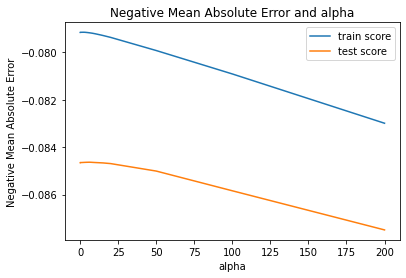

In [71]:
# plotting mean test and train scores with alpha 
cv_results['param_alpha'] = cv_results['param_alpha'].astype('int32')

# plotting
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')
#plt.xscale('log')
plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'], loc='upper right')
plt.show()

In [72]:
# Finding Best "alpha" value
model_cv.best_estimator_

Ridge(alpha=6.0)

In [73]:
alpha_ridge = model_cv.best_estimator_.alpha  # Best alpha
ridge = Ridge(alpha=alpha_ridge)

ridge.fit(X_train_rfe_n, y_train)
ridge.coef_

array([-0.01702392,  0.02669104,  0.01160548,  0.01818313,  0.00968067,
        0.01291899,  0.01720834,  0.08539946,  0.04676243,  0.01249966,
        0.01221569,  0.01357148,  0.01762475,  0.00327826,  0.00299117,
        0.02287878,  0.01864844,  0.01775015, -0.02194937,  0.12792403,
        0.01525295,  0.01852647,  0.01775097,  0.01025474,  0.01323614,
        0.01445067,  0.01823988,  0.01489747,  0.03939394,  0.0156589 ,
        0.01283699, -0.01742217, -0.03541642,  0.01245027,  0.0139578 ,
        0.01303882,  0.02295324, -0.01326943,  0.00948586,  0.02105087,
        0.01193083,  0.01738791, -0.0001671 , -0.01616386,  0.01905114,
        0.00961037,  0.00960125,  0.016879  , -0.0001671 , -0.00992067])

In [74]:
# predict
y_train_pred = model_cv.predict(X_train_rfe_n)
print('R-squared on Training Dataset: ', r2_score(y_true=y_train, y_pred=y_train_pred))

y_test_pred = model_cv.predict(X_test_rfe_n)
print('R-squared on Test dataset: ', r2_score(y_true=y_test, y_pred=y_test_pred))

R-squared on Training Dataset:  0.9163167171724649
R-squared on Test dataset:  0.8181232114733891


Ridge Regression picked 50 features and eliminated the other 0 features


<AxesSubplot:title={'center':'Model Coefficients in the Ridge Regression'}>

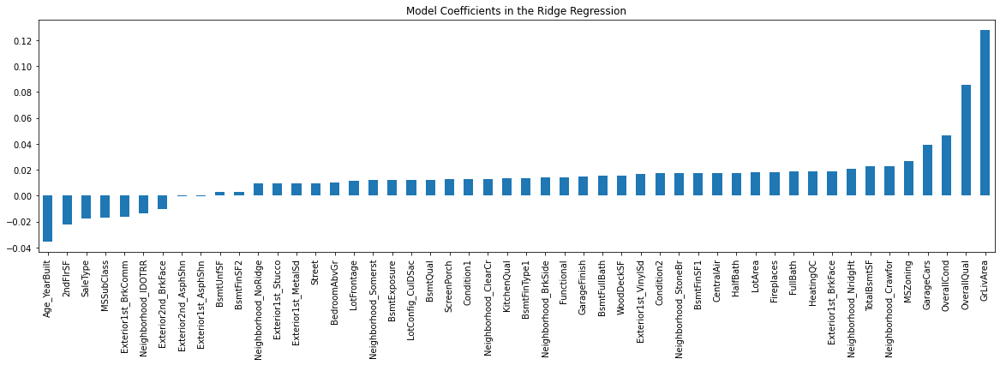

In [75]:
# checking the magnitude of coefficients
predictors_m = X_train_rfe_n.columns.values
coefs = pd.Series(ridge.coef_,predictors_m).sort_values()
print("Ridge Regression picked " + str(sum(coefs != 0)) + " features and eliminated the other " +  \
      str(sum(coefs == 0)) + " features")
plt.figure(figsize=(20,5))
coefs.plot(kind='bar', title='Model Coefficients in the Ridge Regression')

In [76]:
# Ridge model parameters
model_parameters = list(ridge.coef_)
model_parameters.insert(0, ridge.intercept_)
model_parameters = [round(x, 3) for x in model_parameters]
cols = X_train_rfe_n.columns
cols = cols.insert(0, "constant")
sorted(list(zip(cols, model_parameters)), key = lambda x: x[1], reverse = True)

[('constant', 12.022),
 ('GrLivArea', 0.128),
 ('OverallQual', 0.085),
 ('OverallCond', 0.047),
 ('GarageCars', 0.039),
 ('MSZoning', 0.027),
 ('TotalBsmtSF', 0.023),
 ('Neighborhood_Crawfor', 0.023),
 ('Neighborhood_NridgHt', 0.021),
 ('HeatingQC', 0.019),
 ('FullBath', 0.019),
 ('Exterior1st_BrkFace', 0.019),
 ('LotArea', 0.018),
 ('BsmtFinSF1', 0.018),
 ('CentralAir', 0.018),
 ('HalfBath', 0.018),
 ('Fireplaces', 0.018),
 ('Condition2', 0.017),
 ('Neighborhood_StoneBr', 0.017),
 ('Exterior1st_VinylSd', 0.017),
 ('WoodDeckSF', 0.016),
 ('BsmtFullBath', 0.015),
 ('GarageFinish', 0.015),
 ('BsmtFinType1', 0.014),
 ('Functional', 0.014),
 ('Neighborhood_BrkSide', 0.014),
 ('Condition1', 0.013),
 ('KitchenQual', 0.013),
 ('ScreenPorch', 0.013),
 ('Neighborhood_ClearCr', 0.013),
 ('LotFrontage', 0.012),
 ('BsmtQual', 0.012),
 ('BsmtExposure', 0.012),
 ('LotConfig_CulDSac', 0.012),
 ('Neighborhood_Somerst', 0.012),
 ('Street', 0.01),
 ('BedroomAbvGr', 0.01),
 ('Exterior1st_MetalSd', 0.01),

In [77]:
# Calculating Top 5 Important Features
Ridge_cols = sorted(list(zip(cols, map(abs, model_parameters))), key = lambda x: x[1], reverse = True)
first_tuple_elements = [a_tuple[0] for a_tuple in Ridge_cols[:6]]
Ridge_Top5 = first_tuple_elements[1:]
Ridge_Top5

['GrLivArea', 'OverallQual', 'OverallCond', 'GarageCars', 'Age_YearBuilt']

Mean of Residuals -0.00


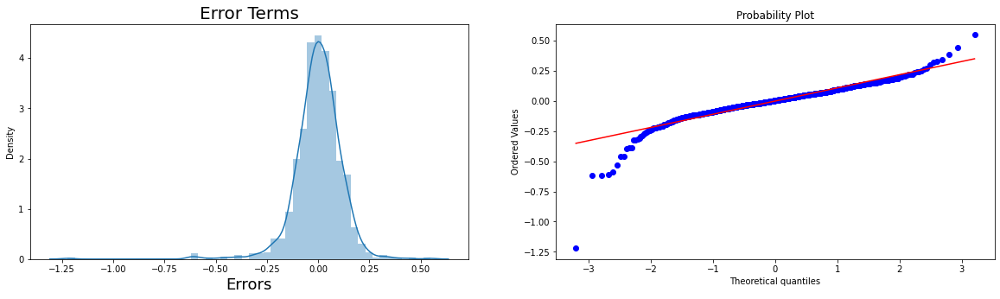

In [78]:
# Check for Normality of error terms/residuals
residuals = y_train - y_train_pred
mean_residuals = np.mean(residuals)
print("Mean of Residuals {:.2f}".format(mean_residuals))

plt.figure(figsize=(20,5))
plt.subplot(121)
sns.distplot(residuals)
plt.title('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)                         # X-label

plt.subplot(122)
res = stats.probplot(residuals, plot=plt) 

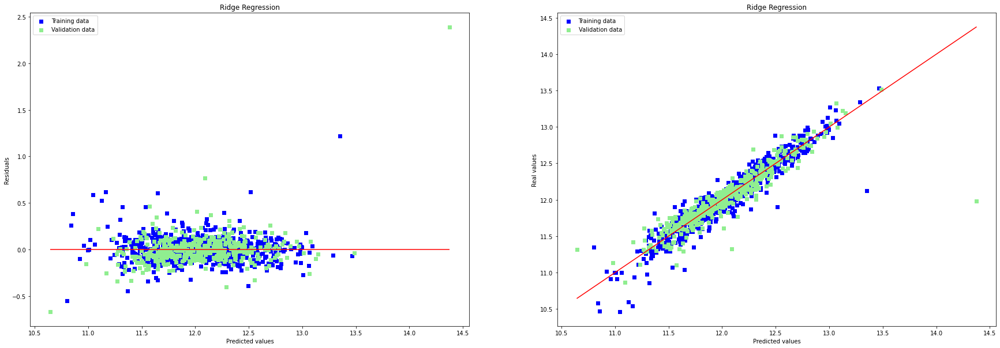

In [79]:
# Plot residuals
plt.figure(figsize=(30, 10))
plt.subplot(121)
residual_plot(y_train,y_test,y_train_pred,y_test_pred,title="Ridge Regression")

# Plot predictions
plt.subplot(122)
prediction_plot(y_train,y_test,y_train_pred,y_test_pred,title="Ridge Regression")


Text(0.5, 0, 'Index')

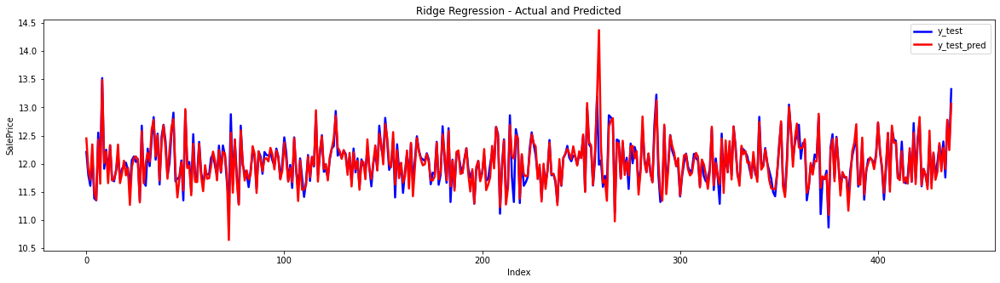

In [80]:
#visualization
plt.figure(figsize=(20,5))
sns.lineplot(range(0,X_test_rfe_n.shape[0]),y_test,color="blue", linewidth=2.5, linestyle="-",label='y_test')
sns.lineplot(range(0,X_test_rfe_n.shape[0]),y_test_pred,color="red", linewidth=2.5, linestyle="-",label = 'y_test_pred')
plt.title('Ridge Regression - Actual and Predicted')
plt.xlabel('Index')

# Lasso Regression

In [81]:
# Lasso
print("=============Linear Regression with Lasso regularization (L1 Penalty)=============")
params = {'alpha': [0.00001, 0.00005, 0.0001, 0.0005, 0.001, 0.01, 0.02, 0.03, 0.04, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 5.0, 10.0]}

lasso = Lasso()

# set up cross validation scheme
folds = KFold(n_splits = 5, shuffle = True, random_state = 0)

model_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1,
                        n_jobs=-1)            

model_cv.fit(X_train_rfe_n, y_train)

y_train_pred = model_cv.predict(X_train_rfe_n)
y_test_pred = model_cv.predict(X_test_rfe_n)

=============Linear Regression with Lasso regularization (L1 Penalty)=============
Fitting 5 folds for each of 23 candidates, totalling 115 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 100 out of 115 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 115 out of 115 | elapsed:    0.2s finished


In [82]:
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results = cv_results[cv_results['param_alpha']<=0.01]
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.015558,0.010755,0.003193,0.000399,0.00001,{'alpha': 1e-05},-0.095304,-0.084876,-0.090447,-0.071947,-0.080681,-0.084651,0.008053,5,-0.075069,-0.079927,-0.078027,-0.082367,-0.080393,-0.079157,0.002466
1,0.019747,0.005762,0.002993,0.000002,0.00005,{'alpha': 5e-05},-0.095299,-0.084817,-0.090426,-0.071952,-0.080695,-0.084637,0.008046,4,-0.075062,-0.079912,-0.078014,-0.082344,-0.080377,-0.079142,0.002461
2,0.012766,0.002393,0.003791,0.000748,0.0001,{'alpha': 0.0001},-0.095294,-0.084744,-0.090396,-0.071955,-0.080713,-0.084620,0.008037,3,-0.075055,-0.079896,-0.077996,-0.082317,-0.080358,-0.079124,0.002455
3,0.006782,0.000399,0.003591,0.001355,0.0005,{'alpha': 0.0005},-0.095352,-0.084168,-0.090164,-0.071995,-0.080884,-0.084513,0.007993,1,-0.075047,-0.079771,-0.077891,-0.082153,-0.080272,-0.079027,0.002409
4,0.006982,0.000631,0.003390,0.000798,0.001,{'alpha': 0.001},-0.095639,-0.083605,-0.089924,-0.072207,-0.081407,-0.084557,0.007937,2,-0.075174,-0.079721,-0.077902,-0.082025,-0.080301,-0.079025,0.002333


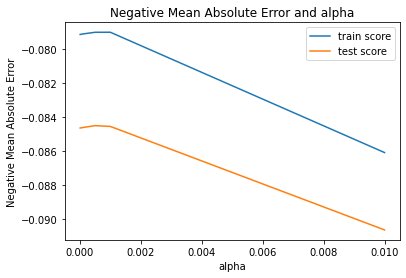

In [83]:
# plotting mean test and train scoes with alpha 
cv_results['param_alpha'] = cv_results['param_alpha'].astype('float32')

# plotting
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')
#plt.xscale('log')
plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'], loc='upper right')
plt.show()

In [84]:
# Finding Best "alpha" value
model_cv.best_estimator_

Lasso(alpha=0.0005)

In [85]:
alpha_lasso = model_cv.best_estimator_.alpha  # Best alpha
lasso = Lasso(alpha=alpha_lasso)
        
lasso.fit(X_train_rfe_n, y_train)
lasso.coef_

array([-0.01689009,  0.02779434,  0.01114338,  0.01769215,  0.00902147,
        0.01250467,  0.01715294,  0.08655757,  0.04666403,  0.01189327,
        0.01199773,  0.01328176,  0.01446614,  0.00166566, -0.        ,
        0.02624594,  0.01832634,  0.01769588, -0.01965958,  0.13058065,
        0.01508175,  0.01642744,  0.01551114,  0.00823   ,  0.0126091 ,
        0.01404339,  0.01774493,  0.01455071,  0.03968516,  0.01533201,
        0.01240006, -0.01702123, -0.03683415,  0.01200174,  0.01319545,
        0.01246278,  0.02241526, -0.01289417,  0.00842668,  0.02034012,
        0.01098215,  0.01651697, -0.        , -0.01597662,  0.01728602,
        0.00857318,  0.00885207,  0.01584064, -0.        , -0.00815593])

In [86]:
# predict
y_train_pred = lasso.predict(X_train_rfe_n)
print('R-squared on Training Dataset: ', r2_score(y_true=y_train, y_pred=y_train_pred))

y_test_pred = lasso.predict(X_test_rfe_n)
print('R-squared on Test dataset: ', r2_score(y_true=y_test, y_pred=y_test_pred))

R-squared on Training Dataset:  0.9162512324085729
R-squared on Test dataset:  0.8185467152326872


Lasso Regression picked 47 features and eliminated the other 3 features


<AxesSubplot:title={'center':'Model Coefficients in the Lasso Regression'}>

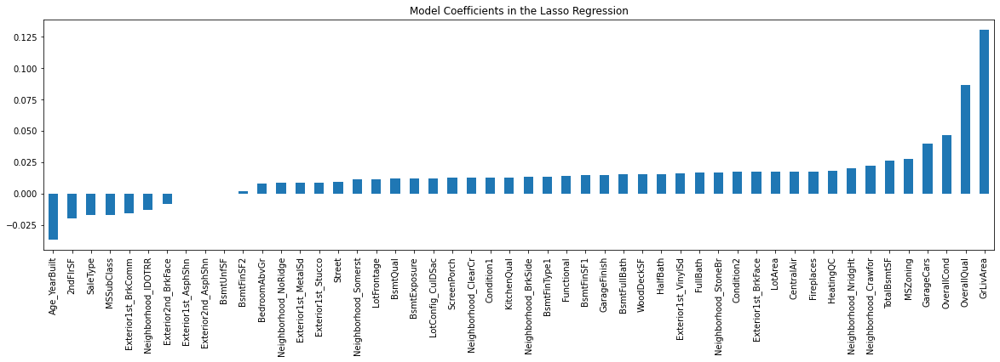

In [87]:
# checking the magnitude of coefficients
predictors_m = X_test_rfe_n.columns.values
coefs = pd.Series(lasso.coef_,predictors_m).sort_values()
print("Lasso Regression picked " + str(sum(coefs != 0)) + " features and eliminated the other " +  \
      str(sum(abs(coefs) == 0)) + " features")
plt.figure(figsize=(20,5))
coefs.plot(kind='bar', title='Model Coefficients in the Lasso Regression')

In [88]:
# Lasso model parameters
model_parameters = list(lasso.coef_)
model_parameters.insert(0, lasso.intercept_)
model_parameters = [round(x, 3) for x in model_parameters]
cols = X_train_rfe_n.columns
cols = cols.insert(0, "constant")
sorted(list(zip(cols, model_parameters)), key = lambda x: x[1], reverse = True)

[('constant', 12.022),
 ('GrLivArea', 0.131),
 ('OverallQual', 0.087),
 ('OverallCond', 0.047),
 ('GarageCars', 0.04),
 ('MSZoning', 0.028),
 ('TotalBsmtSF', 0.026),
 ('Neighborhood_Crawfor', 0.022),
 ('Neighborhood_NridgHt', 0.02),
 ('LotArea', 0.018),
 ('HeatingQC', 0.018),
 ('CentralAir', 0.018),
 ('Fireplaces', 0.018),
 ('Condition2', 0.017),
 ('Neighborhood_StoneBr', 0.017),
 ('Exterior1st_BrkFace', 0.017),
 ('FullBath', 0.016),
 ('HalfBath', 0.016),
 ('Exterior1st_VinylSd', 0.016),
 ('BsmtFullBath', 0.015),
 ('GarageFinish', 0.015),
 ('WoodDeckSF', 0.015),
 ('BsmtFinSF1', 0.014),
 ('Functional', 0.014),
 ('Condition1', 0.013),
 ('BsmtFinType1', 0.013),
 ('KitchenQual', 0.013),
 ('Neighborhood_BrkSide', 0.013),
 ('BsmtQual', 0.012),
 ('BsmtExposure', 0.012),
 ('ScreenPorch', 0.012),
 ('LotConfig_CulDSac', 0.012),
 ('Neighborhood_ClearCr', 0.012),
 ('LotFrontage', 0.011),
 ('Neighborhood_Somerst', 0.011),
 ('Street', 0.009),
 ('Exterior1st_MetalSd', 0.009),
 ('Exterior1st_Stucco', 

In [89]:
# Calculating Top 5 Important Features
Lasso_cols = sorted(list(zip(cols, map(abs, model_parameters))), key = lambda x: x[1], reverse = True)
first_tuple_elements = [a_tuple[0] for a_tuple in Lasso_cols[:6]]
Lasso_Top5 = first_tuple_elements[1:]
Lasso_Top5
first_tuple_elements = [a_tuple[0] for a_tuple in Lasso_cols[:11]]
Lasso_Top10 = first_tuple_elements[1:]
Lasso_Top10

['GrLivArea',
 'OverallQual',
 'OverallCond',
 'GarageCars',
 'Age_YearBuilt',
 'MSZoning',
 'TotalBsmtSF',
 'Neighborhood_Crawfor',
 '2ndFlrSF',
 'Neighborhood_NridgHt']

Mean of Residuals -0.00


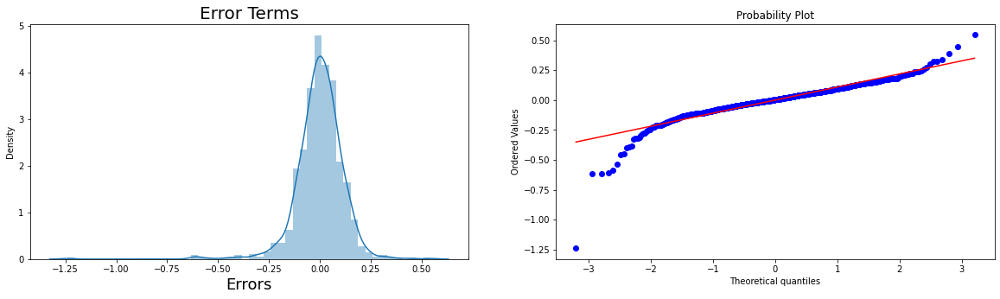

In [90]:
# Check for Normality of error terms/residuals
residuals = y_train - y_train_pred
mean_residuals = np.mean(residuals)
print("Mean of Residuals {:.2f}".format(mean_residuals))

plt.figure(figsize=(20,5))
plt.subplot(121)
sns.distplot(residuals)
plt.title('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)                         # X-label

plt.subplot(122)
res = stats.probplot(residuals, plot=plt) 

Mean of Residuals -0.00


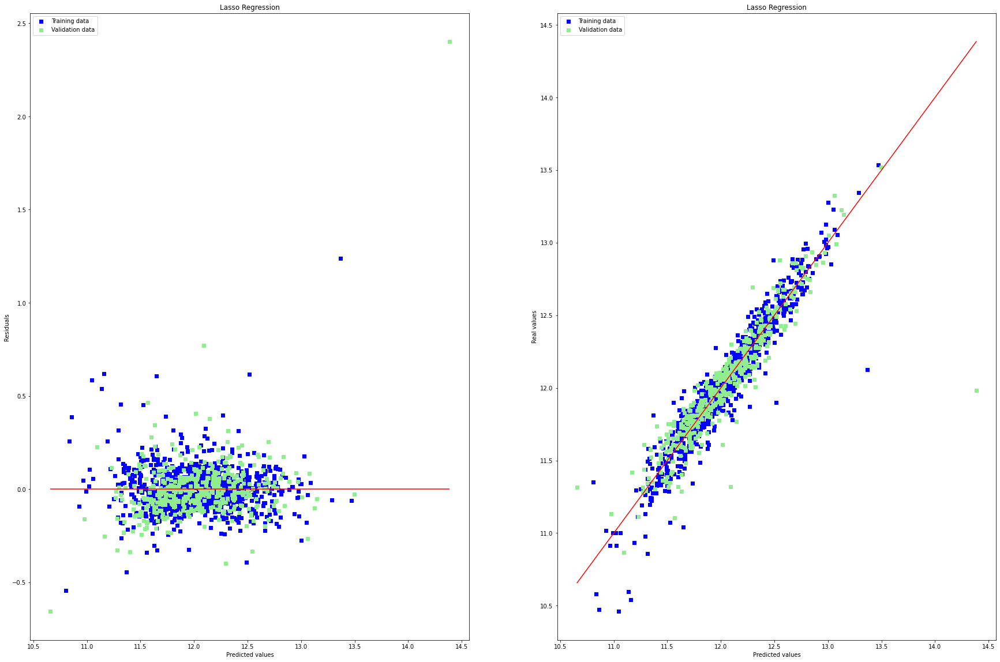

In [91]:
# Plot residuals
plt.figure(figsize=(30, 20))
plt.subplot(121)
residual_plot(y_train,y_test,y_train_pred,y_test_pred,title="Lasso Regression")

# Plot predictions
plt.subplot(122)
prediction_plot(y_train,y_test,y_train_pred,y_test_pred,title="Lasso Regression")

# Check for Normality of error terms/residuals
residuals = y_train - y_train_pred
mean_residuals = np.mean(residuals)
print("Mean of Residuals {:.2f}".format(mean_residuals))

Text(0.5, 0, 'Index')

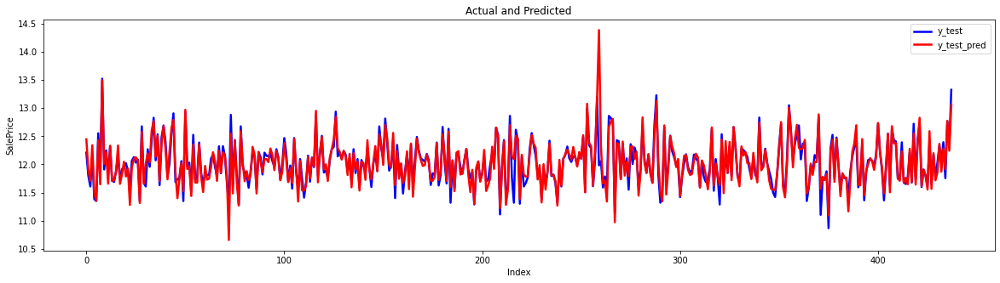

In [92]:
#visualization
plt.figure(figsize=(20,5))
sns.lineplot(range(0,X_test_rfe_n.shape[0]),y_test,color="blue", linewidth=2.5, linestyle="-",label='y_test')
sns.lineplot(range(0,X_test_rfe_n.shape[0]),y_test_pred,color="red", linewidth=2.5, linestyle="-",label = 'y_test_pred')
plt.title('Actual and Predicted')
plt.xlabel('Index')

# Inference or Conclusion

It can be inferred or concluded that Lasso Regression model should be preferred as R-squared for training for lasso is less than ridge where as the R-squared for testing for lasso is greater than ridge. I’ll like to go with Lasso Regression as Lasso Regression picked 47 features and eliminated the other 3 features and the model is helping in feature selection as well and dropping the insignificant features hence making the model more robust.

Top 10 Important features: ['GrLivArea',
 'OverallQual',
 'OverallCond',
 'GarageCars',
 'Age_YearBuilt',
 'MSZoning',
 'TotalBsmtSF',
 'Neighborhood_Crawfor',
 'Neighborhood_NridgHt',
 'HeatingQC']

# Assignment Part-II

In [93]:
Ridge_Top5

['GrLivArea', 'OverallQual', 'OverallCond', 'GarageCars', 'Age_YearBuilt']

In [94]:
Lasso_Top5

['GrLivArea', 'OverallQual', 'OverallCond', 'GarageCars', 'Age_YearBuilt']

In [95]:
alpha_ridge

6.0

In [96]:
alpha_lasso

0.0005

## Ridge Optimal alpha Doubled

In [97]:
alpha_ridge_doubled = model_cv.best_estimator_.alpha * 2 # Best alpha
ridge = Ridge(alpha=alpha_ridge_doubled)

ridge.fit(X_train_rfe_n, y_train)
ridge.coef_

array([-0.01721198,  0.02666578,  0.01108092,  0.01821041,  0.00970114,
        0.01325197,  0.01742041,  0.08585086,  0.04726059,  0.01291639,
        0.01215457,  0.01392703,  0.01657854,  0.0029677 ,  0.00217259,
        0.02080005,  0.01867798,  0.0175795 , -0.02661963,  0.13425363,
        0.01530351,  0.01763894,  0.01809383,  0.01011495,  0.01249311,
        0.01486447,  0.01761544,  0.01465195,  0.03910677,  0.01551519,
        0.01280839, -0.01736825, -0.03629758,  0.01233437,  0.01419027,
        0.01329708,  0.02281623, -0.01315972,  0.00928668,  0.02111578,
        0.0120375 ,  0.01738755, -0.00035034, -0.01617722,  0.01913413,
        0.00987238,  0.00971535,  0.01727359, -0.00035034, -0.00999844])

In [98]:
# predict
y_train_pred = model_cv.predict(X_train_rfe_n)
print('R-squared on Training Dataset: ', r2_score(y_true=y_train, y_pred=y_train_pred))

y_test_pred = model_cv.predict(X_test_rfe_n)
print('R-squared on Test dataset: ', r2_score(y_true=y_test, y_pred=y_test_pred))

R-squared on Training Dataset:  0.9162512324085729
R-squared on Test dataset:  0.8185467152326872


Ridge Regression picked 50 features and eliminated the other 0 features


<AxesSubplot:title={'center':'Model Coefficients in the Ridge Regression'}>

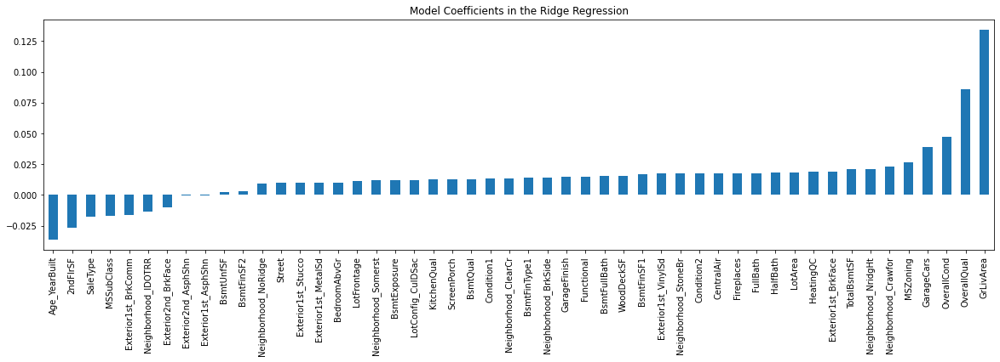

In [99]:
# checking the magnitude of coefficients
predictors_m = X_train_rfe_n.columns.values
coefs = pd.Series(ridge.coef_,predictors_m).sort_values()
print("Ridge Regression picked " + str(sum(coefs != 0)) + " features and eliminated the other " +  \
      str(sum(coefs == 0)) + " features")
plt.figure(figsize=(20,5))
coefs.plot(kind='bar', title='Model Coefficients in the Ridge Regression')

In [100]:
# Ridge model parameters
model_parameters = list(ridge.coef_)
model_parameters.insert(0, ridge.intercept_)
model_parameters = [round(x, 3) for x in model_parameters]
cols = X_train_rfe_n.columns
cols = cols.insert(0, "constant")
sorted(list(zip(cols, model_parameters)), key = lambda x: x[1], reverse = True)

[('constant', 12.022),
 ('GrLivArea', 0.134),
 ('OverallQual', 0.086),
 ('OverallCond', 0.047),
 ('GarageCars', 0.039),
 ('MSZoning', 0.027),
 ('Neighborhood_Crawfor', 0.023),
 ('TotalBsmtSF', 0.021),
 ('Neighborhood_NridgHt', 0.021),
 ('HeatingQC', 0.019),
 ('Exterior1st_BrkFace', 0.019),
 ('LotArea', 0.018),
 ('CentralAir', 0.018),
 ('FullBath', 0.018),
 ('HalfBath', 0.018),
 ('Fireplaces', 0.018),
 ('Condition2', 0.017),
 ('BsmtFinSF1', 0.017),
 ('Neighborhood_StoneBr', 0.017),
 ('Exterior1st_VinylSd', 0.017),
 ('WoodDeckSF', 0.016),
 ('BsmtFullBath', 0.015),
 ('Functional', 0.015),
 ('GarageFinish', 0.015),
 ('BsmtFinType1', 0.014),
 ('Neighborhood_BrkSide', 0.014),
 ('Condition1', 0.013),
 ('BsmtQual', 0.013),
 ('ScreenPorch', 0.013),
 ('Neighborhood_ClearCr', 0.013),
 ('BsmtExposure', 0.012),
 ('KitchenQual', 0.012),
 ('LotConfig_CulDSac', 0.012),
 ('Neighborhood_Somerst', 0.012),
 ('LotFrontage', 0.011),
 ('Street', 0.01),
 ('BedroomAbvGr', 0.01),
 ('Exterior1st_MetalSd', 0.01),

In [101]:
# Calculating Top 5 Important Features
Ridge_cols = sorted(list(zip(cols, map(abs, model_parameters))), key = lambda x: x[1], reverse = True)
first_tuple_elements = [a_tuple[0] for a_tuple in Ridge_cols[:6]]
Ridge_Top5_Doubled = first_tuple_elements[1:]
Ridge_Top5_Doubled

['GrLivArea', 'OverallQual', 'OverallCond', 'GarageCars', 'Age_YearBuilt']

Mean of Residuals -0.00


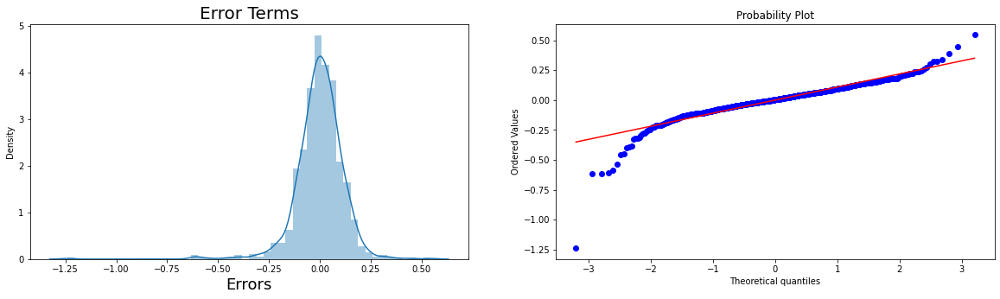

In [102]:
# Check for Normality of error terms/residuals
residuals = y_train - y_train_pred
mean_residuals = np.mean(residuals)
print("Mean of Residuals {:.2f}".format(mean_residuals))

plt.figure(figsize=(20,5))
plt.subplot(121)
sns.distplot(residuals)
plt.title('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)                         # X-label

plt.subplot(122)
res = stats.probplot(residuals, plot=plt) 

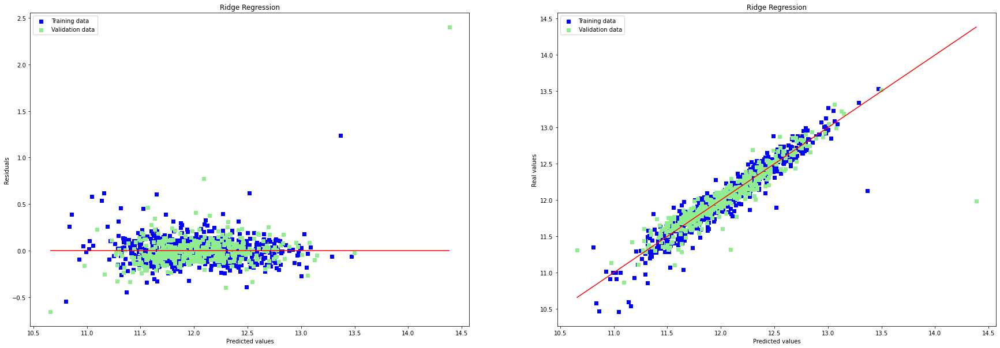

In [103]:
# Plot residuals
plt.figure(figsize=(30, 10))
plt.subplot(121)
residual_plot(y_train,y_test,y_train_pred,y_test_pred,title="Ridge Regression")

# Plot predictions
plt.subplot(122)
prediction_plot(y_train,y_test,y_train_pred,y_test_pred,title="Ridge Regression")


Text(0.5, 0, 'Index')

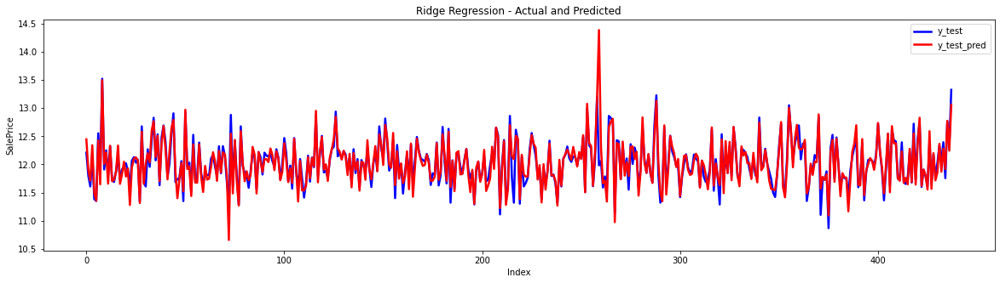

In [104]:
#visualization
plt.figure(figsize=(20,5))
sns.lineplot(range(0,X_test_rfe_n.shape[0]),y_test,color="blue", linewidth=2.5, linestyle="-",label='y_test')
sns.lineplot(range(0,X_test_rfe_n.shape[0]),y_test_pred,color="red", linewidth=2.5, linestyle="-",label = 'y_test_pred')
plt.title('Ridge Regression - Actual and Predicted')
plt.xlabel('Index')

## Lasso Optimal alpha Doubled

In [105]:
alpha_lasso_doubled = model_cv.best_estimator_.alpha * 2  # Best alpha
lasso = Lasso(alpha=alpha_lasso_doubled)
        
lasso.fit(X_train_rfe_n, y_train)
lasso.coef_

array([-0.01655836,  0.02891685,  0.01120922,  0.01717719,  0.00834108,
        0.01178559,  0.01688668,  0.08730738,  0.04607389,  0.01085033,
        0.01182428,  0.01261316,  0.0145614 ,  0.00117139, -0.        ,
        0.02936684,  0.01798865,  0.01771671, -0.01305866,  0.12723799,
        0.01485401,  0.01524419,  0.01296592,  0.0063932 ,  0.01274149,
        0.013266  ,  0.01785205,  0.01443258,  0.04017784,  0.01514148,
        0.01199834, -0.01666891, -0.03745843,  0.01166143,  0.01220083,
        0.01164567,  0.02200534, -0.01263547,  0.00757297,  0.0195672 ,
        0.00992574,  0.01564854, -0.        , -0.01576859,  0.01541734,
        0.00727792,  0.00798667,  0.0144092 , -0.        , -0.00630982])

In [106]:
# predict
y_train_pred = lasso.predict(X_train_rfe_n)
print('R-squared on Training Dataset: ', r2_score(y_true=y_train, y_pred=y_train_pred))

y_test_pred = lasso.predict(X_test_rfe_n)
print('R-squared on Test dataset: ', r2_score(y_true=y_test, y_pred=y_test_pred))

R-squared on Training Dataset:  0.9159651703802929
R-squared on Test dataset:  0.81897349485103


Lasso Regression picked 47 features and eliminated the other 3 features


<AxesSubplot:title={'center':'Model Coefficients in the Lasso Regression'}>

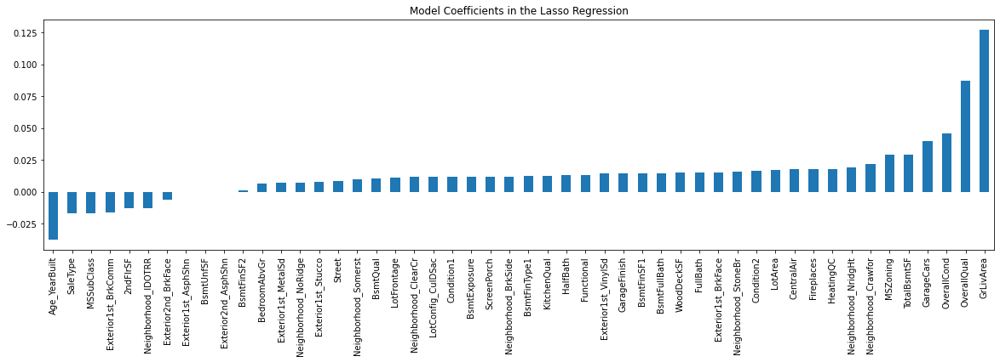

In [107]:
# checking the magnitude of coefficients
predictors_m = X_test_rfe_n.columns.values
coefs = pd.Series(lasso.coef_,predictors_m).sort_values()
print("Lasso Regression picked " + str(sum(coefs != 0)) + " features and eliminated the other " +  \
      str(sum(abs(coefs) == 0)) + " features")
plt.figure(figsize=(20,5))
coefs.plot(kind='bar', title='Model Coefficients in the Lasso Regression')

In [108]:
# Lasso model parameters
model_parameters = list(lasso.coef_)
model_parameters.insert(0, lasso.intercept_)
model_parameters = [round(x, 3) for x in model_parameters]
cols = X_train_rfe_n.columns
cols = cols.insert(0, "constant")
sorted(list(zip(cols, model_parameters)), key = lambda x: x[1], reverse = True)

[('constant', 12.022),
 ('GrLivArea', 0.127),
 ('OverallQual', 0.085),
 ('OverallCond', 0.046),
 ('GarageCars', 0.041),
 ('TotalBsmtSF', 0.031),
 ('MSZoning', 0.03),
 ('Neighborhood_Crawfor', 0.022),
 ('Neighborhood_NridgHt', 0.02),
 ('HeatingQC', 0.018),
 ('CentralAir', 0.018),
 ('Fireplaces', 0.018),
 ('LotArea', 0.017),
 ('Condition2', 0.017),
 ('FullBath', 0.016),
 ('Neighborhood_StoneBr', 0.016),
 ('BsmtFullBath', 0.015),
 ('GarageFinish', 0.015),
 ('WoodDeckSF', 0.015),
 ('Exterior1st_BrkFace', 0.015),
 ('BsmtFinType1', 0.014),
 ('BsmtFinSF1', 0.014),
 ('HalfBath', 0.014),
 ('Functional', 0.014),
 ('Exterior1st_VinylSd', 0.014),
 ('KitchenQual', 0.013),
 ('LotFrontage', 0.012),
 ('Condition1', 0.012),
 ('BsmtExposure', 0.012),
 ('ScreenPorch', 0.012),
 ('LotConfig_CulDSac', 0.012),
 ('Neighborhood_BrkSide', 0.012),
 ('BsmtQual', 0.011),
 ('Neighborhood_ClearCr', 0.011),
 ('Neighborhood_Somerst', 0.01),
 ('Street', 0.008),
 ('Exterior1st_Stucco', 0.008),
 ('Neighborhood_NoRidge', 

In [108]:
# Calculating Top 5 Important Features
Lasso_cols = sorted(list(zip(cols, map(abs, model_parameters))), key = lambda x: x[1], reverse = True)
first_tuple_elements = [a_tuple[0] for a_tuple in Lasso_cols[:6]]
Lasso_Top5_Doubled = first_tuple_elements[1:]
Lasso_Top5_Doubled

['GrLivArea', 'OverallQual', 'OverallCond', 'GarageCars', 'Age_YearBuilt']

Mean of Residuals -0.00


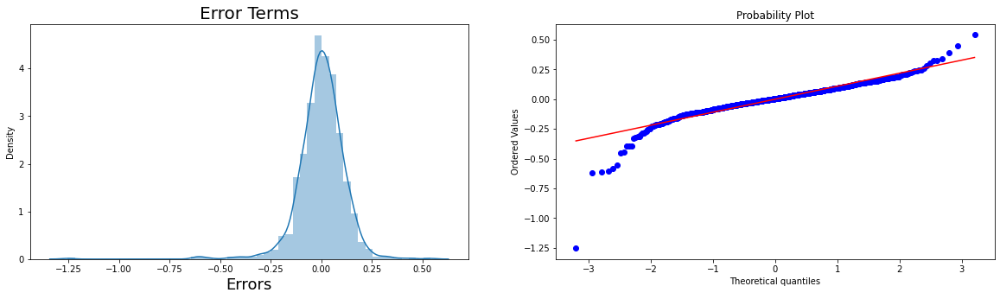

In [109]:
# Check for Normality of error terms/residuals
residuals = y_train - y_train_pred
mean_residuals = np.mean(residuals)
print("Mean of Residuals {:.2f}".format(mean_residuals))

plt.figure(figsize=(20,5))
plt.subplot(121)
sns.distplot(residuals)
plt.title('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)                         # X-label

plt.subplot(122)
res = stats.probplot(residuals, plot=plt) 

Mean of Residuals -0.00


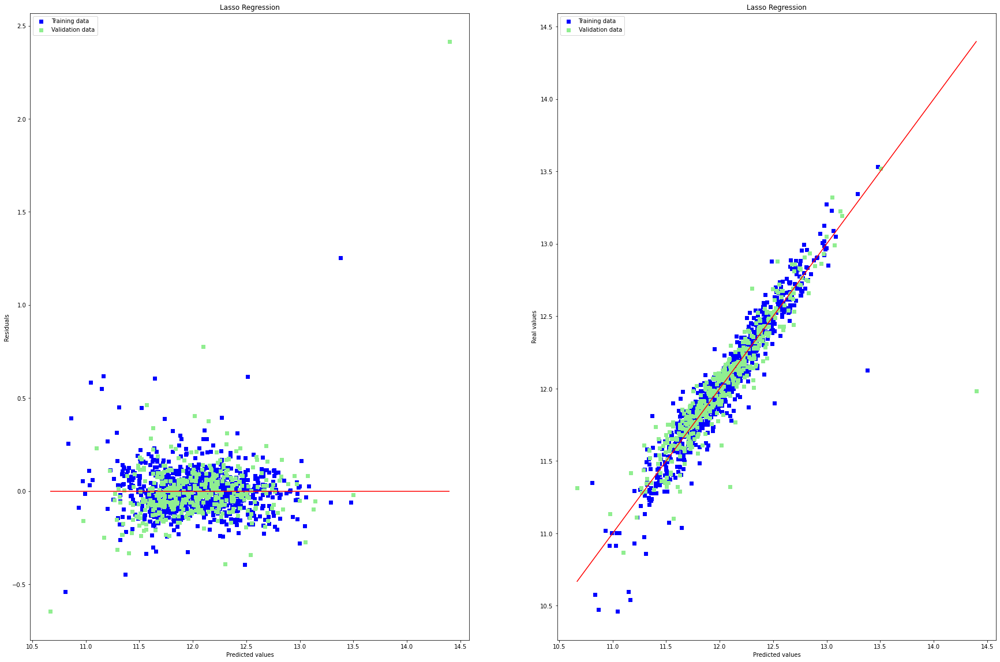

In [110]:
# Plot residuals
plt.figure(figsize=(30, 20))
plt.subplot(121)
residual_plot(y_train,y_test,y_train_pred,y_test_pred,title="Lasso Regression")

# Plot predictions
plt.subplot(122)
prediction_plot(y_train,y_test,y_train_pred,y_test_pred,title="Lasso Regression")

# Check for Normality of error terms/residuals
residuals = y_train - y_train_pred
mean_residuals = np.mean(residuals)
print("Mean of Residuals {:.2f}".format(mean_residuals))

Text(0.5, 0, 'Index')

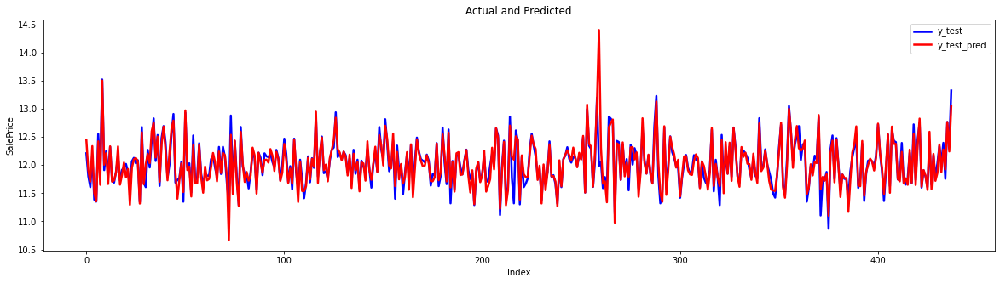

In [111]:
#visualization
plt.figure(figsize=(20,5))
sns.lineplot(range(0,X_test_rfe_n.shape[0]),y_test,color="blue", linewidth=2.5, linestyle="-",label='y_test')
sns.lineplot(range(0,X_test_rfe_n.shape[0]),y_test_pred,color="red", linewidth=2.5, linestyle="-",label = 'y_test_pred')
plt.title('Actual and Predicted')
plt.xlabel('Index')

In [112]:
Ridge_Top5_Doubled

['GrLivArea', 'OverallQual', 'OverallCond', 'GarageCars', 'Age_YearBuilt']

In [113]:
Lasso_Top5_Doubled

['GrLivArea', 'OverallQual', 'OverallCond', 'GarageCars', 'Age_YearBuilt']

## Lasso model excluding the five most important predictor variables

In [114]:
Lasso_Top5

['GrLivArea', 'OverallQual', 'OverallCond', 'GarageCars', 'Age_YearBuilt']

In [115]:
X_train_rfe_n.drop(Lasso_Top5, axis = 1, inplace = True)
X_test_rfe_n.drop(Lasso_Top5, axis = 1, inplace = True)

In [117]:
alpha_lasso

0.0005

In [116]:
lasso = Lasso(alpha=alpha_lasso)
        
lasso.fit(X_train_rfe_n, y_train)
lasso.coef_

array([-0.01597374,  0.02087507,  0.02691764,  0.01983981,  0.01142741,
        0.00696136,  0.01165779,  0.01758326,  0.01870259,  0.01441977,
        0.01305797,  0.00078755, -0.        ,  0.09684591,  0.02194539,
        0.03332357,  0.06900695,  0.01193454,  0.05912695,  0.02568493,
        0.01709617,  0.06167767,  0.01787862,  0.04056374,  0.03601411,
        0.01773626,  0.01934372, -0.01659875,  0.01876735,  0.01419238,
        0.00577957,  0.03547698, -0.02083586,  0.02170548,  0.03243062,
        0.02018839,  0.0249656 ,  0.00626738, -0.01881582,  0.02436724,
        0.00662161,  0.01215884,  0.01301985,  0.00068468, -0.01865284])

In [117]:
# predict
y_train_pred = lasso.predict(X_train_rfe_n)
print('R-squared on Training Dataset: ', r2_score(y_true=y_train, y_pred=y_train_pred))

y_test_pred = lasso.predict(X_test_rfe_n)
print('R-squared on Test dataset: ', r2_score(y_true=y_test, y_pred=y_test_pred))

R-squared on Training Dataset:  0.8639015536056014
R-squared on Test dataset:  0.755306325280297


Lasso Regression picked 44 features and eliminated the other 1 features


<AxesSubplot:title={'center':'Model Coefficients in the Lasso Regression'}>

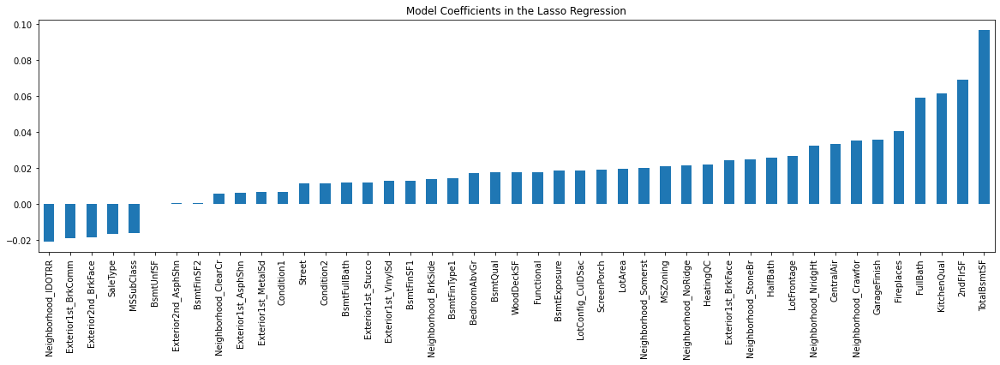

In [118]:
# checking the magnitude of coefficients
predictors_m = X_test_rfe_n.columns.values
coefs = pd.Series(lasso.coef_,predictors_m).sort_values()
print("Lasso Regression picked " + str(sum(coefs != 0)) + " features and eliminated the other " +  \
      str(sum(abs(coefs) == 0)) + " features")
plt.figure(figsize=(20,5))
coefs.plot(kind='bar', title='Model Coefficients in the Lasso Regression')

In [119]:
# Lasso model parameters
model_parameters = list(lasso.coef_)
model_parameters.insert(0, lasso.intercept_)
model_parameters = [round(x, 3) for x in model_parameters]
cols = X_train_rfe_n.columns
cols = cols.insert(0, "constant")
sorted(list(zip(cols, model_parameters)), key = lambda x: x[1], reverse = True)

[('constant', 12.022),
 ('TotalBsmtSF', 0.097),
 ('2ndFlrSF', 0.069),
 ('KitchenQual', 0.062),
 ('FullBath', 0.059),
 ('Fireplaces', 0.041),
 ('GarageFinish', 0.036),
 ('Neighborhood_Crawfor', 0.035),
 ('CentralAir', 0.033),
 ('Neighborhood_NridgHt', 0.032),
 ('LotFrontage', 0.027),
 ('HalfBath', 0.026),
 ('Neighborhood_StoneBr', 0.025),
 ('Exterior1st_BrkFace', 0.024),
 ('HeatingQC', 0.022),
 ('Neighborhood_NoRidge', 0.022),
 ('MSZoning', 0.021),
 ('LotArea', 0.02),
 ('Neighborhood_Somerst', 0.02),
 ('BsmtExposure', 0.019),
 ('ScreenPorch', 0.019),
 ('LotConfig_CulDSac', 0.019),
 ('BsmtQual', 0.018),
 ('Functional', 0.018),
 ('WoodDeckSF', 0.018),
 ('BedroomAbvGr', 0.017),
 ('BsmtFinType1', 0.014),
 ('Neighborhood_BrkSide', 0.014),
 ('BsmtFinSF1', 0.013),
 ('Exterior1st_VinylSd', 0.013),
 ('Condition2', 0.012),
 ('BsmtFullBath', 0.012),
 ('Exterior1st_Stucco', 0.012),
 ('Street', 0.011),
 ('Condition1', 0.007),
 ('Exterior1st_MetalSd', 0.007),
 ('Neighborhood_ClearCr', 0.006),
 ('Exte

In [120]:
# Calculating Top 5 Important Features
Lasso_cols = sorted(list(zip(cols, map(abs, model_parameters))), key = lambda x: x[1], reverse = True)
first_tuple_elements = [a_tuple[0] for a_tuple in Lasso_cols[:6]]
Lasso_Top5_second = first_tuple_elements[1:]
Lasso_Top5_second

['TotalBsmtSF', '2ndFlrSF', 'KitchenQual', 'FullBath', 'Fireplaces']

Mean of Residuals -0.00


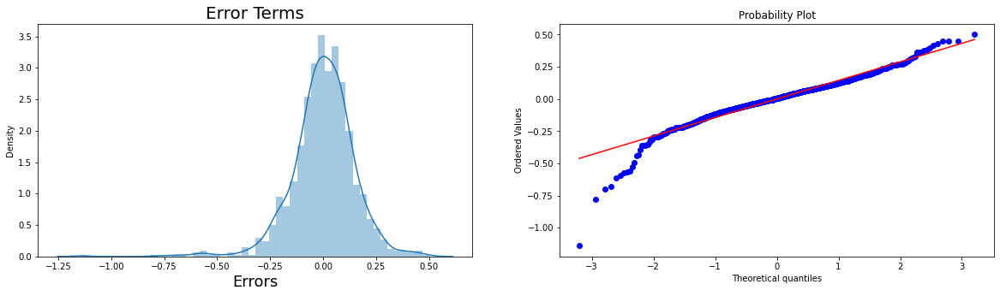

In [121]:
# Check for Normality of error terms/residuals
residuals = y_train - y_train_pred
mean_residuals = np.mean(residuals)
print("Mean of Residuals {:.2f}".format(mean_residuals))

plt.figure(figsize=(20,5))
plt.subplot(121)
sns.distplot(residuals)
plt.title('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)                         # X-label

plt.subplot(122)
res = stats.probplot(residuals, plot=plt) 

Mean of Residuals -0.00


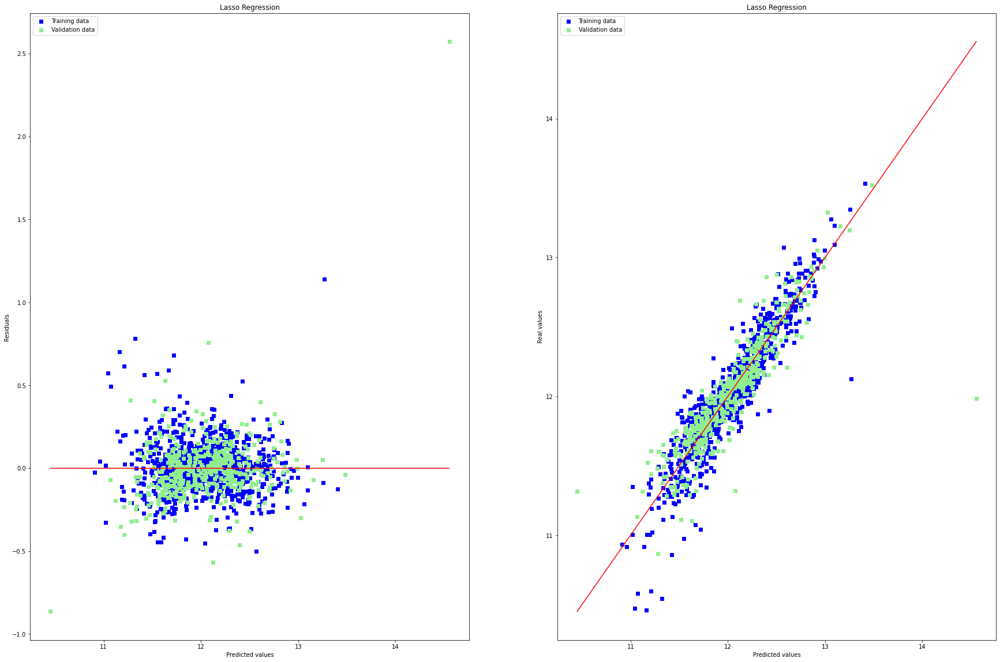

In [122]:
# Plot residuals
plt.figure(figsize=(30, 20))
plt.subplot(121)
residual_plot(y_train,y_test,y_train_pred,y_test_pred,title="Lasso Regression")

# Plot predictions
plt.subplot(122)
prediction_plot(y_train,y_test,y_train_pred,y_test_pred,title="Lasso Regression")

# Check for Normality of error terms/residuals
residuals = y_train - y_train_pred
mean_residuals = np.mean(residuals)
print("Mean of Residuals {:.2f}".format(mean_residuals))

Text(0.5, 0, 'Index')

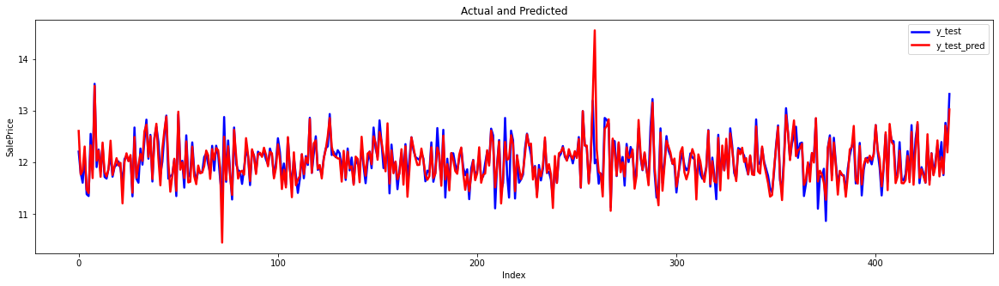

In [123]:
#visualization
plt.figure(figsize=(20,5))
sns.lineplot(range(0,X_test_rfe_n.shape[0]),y_test,color="blue", linewidth=2.5, linestyle="-",label='y_test')
sns.lineplot(range(0,X_test_rfe_n.shape[0]),y_test_pred,color="red", linewidth=2.5, linestyle="-",label = 'y_test_pred')
plt.title('Actual and Predicted')
plt.xlabel('Index')

In [124]:
Lasso_Top5

['GrLivArea', 'OverallQual', 'OverallCond', 'GarageCars', 'Age_YearBuilt']

In [125]:
Lasso_Top10


['GrLivArea',
 'OverallQual',
 'OverallCond',
 'GarageCars',
 'Age_YearBuilt',
 'MSZoning',
 'TotalBsmtSF',
 'Neighborhood_Crawfor',
 '2ndFlrSF',
 'Neighborhood_NridgHt']

In [126]:
Lasso_Top5_second

['TotalBsmtSF', '2ndFlrSF', 'KitchenQual', 'FullBath', 'Fireplaces']